In [ ]:
##10608912.txt

[(['Columbia', 'Magenta'], [('keep', 'action')]), (['Columbia', 'Magenta', 'Riff Raff'], [('say', 'conversations'), ('care', 'affection'), ('giving', 'action'), ('hit', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('plan', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('cast', 'action')]), (['Magenta', 'Riff Raff'], [('bit', 'action')]), (['Magenta', 'Riff Raff'], [('play', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('love', 'affection'), ('use', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('trust', 'action')]), (['Frank N. Furter', 'Magenta'], [('say', 'conversations'), ('touch', 'action')]), (['Frank N. Furter', 'Magenta'], [('act', 'action'), ('miss', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('call', 'conversations'), ('burst', 'action'), ('think', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('say', 'conversations'), ('roll', 'action'), ('guess', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('say', 'conversations'), ('ask', 'a

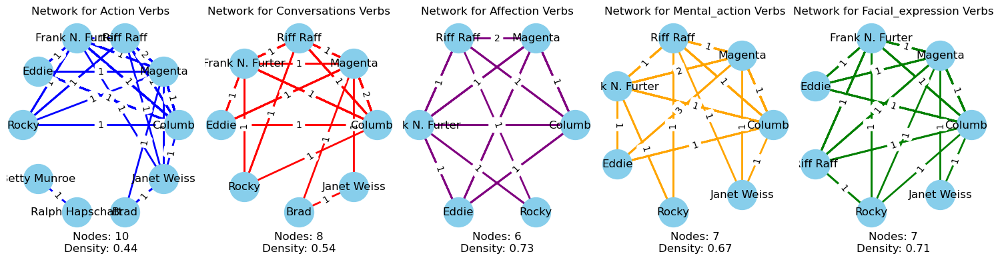

In [4]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt


def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs


def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants


def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text


def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences


def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs


def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text


def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text


text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/10608912.txt'


text = read_text_file(text_file_path)


action_verbs_file = 'verb_cater_1.json'


character_variants_file = 'character_variants_RHPS.json'


action_verbs = load_action_verbs(action_verbs_file)


character_variants = load_character_variants(character_variants_file)


relevant_sentences = extract_relevant_sentences(text, character_variants)


character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)


def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks


def calculate_network_density(network):
    simple_network = nx.Graph(network)  
    density = nx.density(simple_network)
    return density


def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout() 
    plt.show()

networks = build_multiedge_network(character_verb_pairs)


visualize_multiedge_networks(networks)


In [ ]:
##1060979.txt

[(['Magenta', 'Riff Raff'], [('come', 'action')]), (['Magenta', 'Riff Raff'], [('follow', 'action')]), (['Magenta', 'Riff Raff'], [('met', 'action'), ('wonder', 'mental_action')]), (['Magenta', 'Riff Raff'], [('smile', 'facial_expression'), ('love', 'affection'), ('roll', 'action')]), (['Magenta', 'Riff Raff'], [('like', 'affection'), ('beat', 'action'), ('feel', 'mental_action')]), (['Magenta', 'Riff Raff'], [('whisper', 'conversations')]), (['Magenta', 'Riff Raff'], [('whisper', 'conversations'), ('kiss', 'affection'), ('saw', 'action')]), (['Magenta', 'Riff Raff'], [('face', 'action')]), (['Magenta', 'Riff Raff'], [('shot', 'action')]), (['Magenta', 'Riff Raff'], [('kiss', 'affection'), ('met', 'action'), ('thought', 'mental_action')]), (['Magenta', 'Riff Raff'], [('met', 'action'), ('make', 'mental_action')]), (['Magenta', 'Riff Raff'], [('moan', 'facial_expression'), ('love', 'affection'), ('shudder', 'action')]), (['Magenta', 'Riff Raff'], [('move', 'action')]), (['Magenta', 'Rif

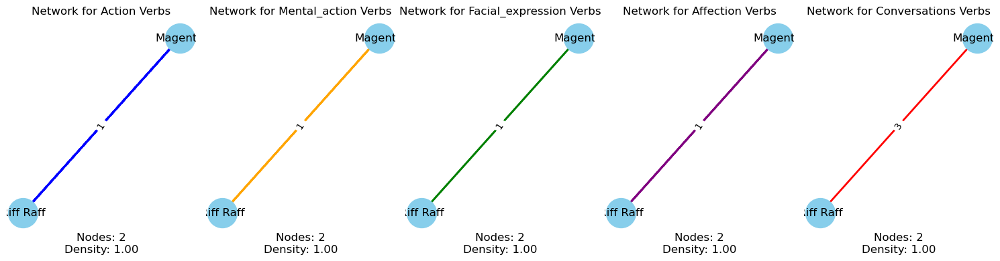

In [5]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt


def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs


def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants


def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text


def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences


def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs


def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text


def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text


text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/1060979.txt'


text = read_text_file(text_file_path)


action_verbs_file = 'verb_cater_1.json'


character_variants_file = 'character_variants_RHPS.json'


action_verbs = load_action_verbs(action_verbs_file)


character_variants = load_character_variants(character_variants_file)


relevant_sentences = extract_relevant_sentences(text, character_variants)


character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks


def calculate_network_density(network):
    simple_network = nx.Graph(network)  
    density = nx.density(simple_network)
    return density

# 
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4)) 

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  
    plt.show()


networks = build_multiedge_network(character_verb_pairs)


visualize_multiedge_networks(networks)


In [147]:
##1061993.txt

[(['Eddie', 'Frank N. Furter', 'Magenta', 'Riff Raff'], [('say', 'conversations'), ('love', 'affection'), ('saw', 'action'), ('need', 'mental_action')]), (['Eddie', 'Frank N. Furter', 'Magenta'], [('call', 'conversations'), ('met', 'action'), ('hate', 'mental_action')]), (['Columbia', 'Frank N. Furter'], [('ask', 'action')]), (['Columbia', 'Magenta'], [('lean', 'facial_expression'), ('clean', 'action'), ('need', 'mental_action')]), (['Columbia', 'Frank N. Furter', 'Riff Raff'], [('nod', 'action'), ('decide', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('take', 'action')]), (['Columbia', 'Magenta'], [('ask', 'action'), ('thought', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('lay', 'action'), ('dream', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('ask', 'action'), ('need', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('ask', 'action'), ('think', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('have', 'action')]), (['Frank N. Furter', '

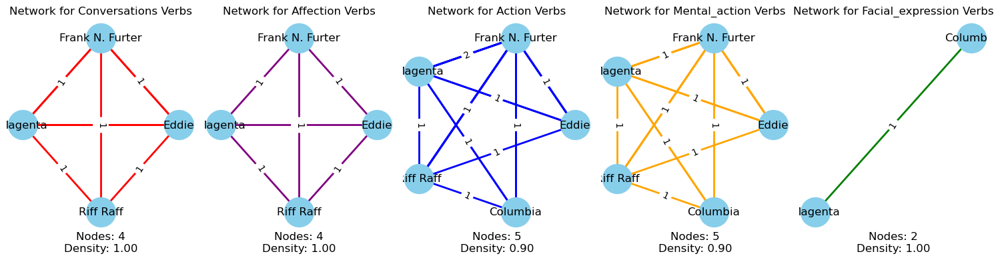

In [3]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt


def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs


def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants


def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text


def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences


def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs


def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text


def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text


text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/1061993.txt'


text = read_text_file(text_file_path)

action_verbs_file = 'verb_cater_1.json'


character_variants_file = 'character_variants_RHPS.json'


action_verbs = load_action_verbs(action_verbs_file)


character_variants = load_character_variants(character_variants_file)


relevant_sentences = extract_relevant_sentences(text, character_variants)


character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)


def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks


def calculate_network_density(network):
    simple_network = nx.Graph(network)  
    density = nx.density(simple_network)
    return density


def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
           
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

           
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout() 
    plt.show()


networks = build_multiedge_network(character_verb_pairs)


visualize_multiedge_networks(networks)


In [149]:
##10748502.txt

[(['Columbia', 'Rocky'], [('feel', 'mental_action')]), (['Frank N. Furter', 'Rocky'], [('act', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('thought', 'mental_action')]), (['Eddie', 'Magenta'], [('cast', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('get', 'action')])]


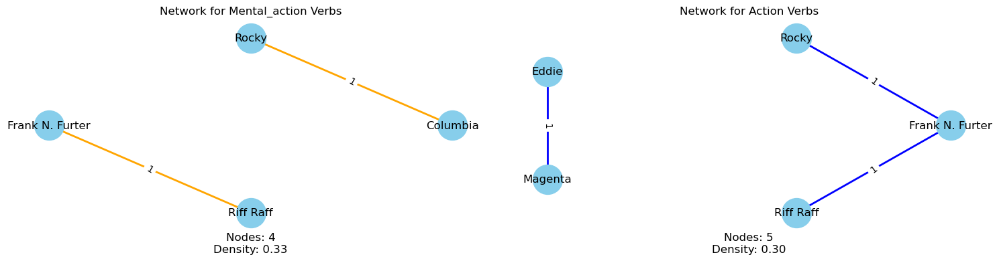

In [6]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt


def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs


def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants


def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text


def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences


def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs


def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text


def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text


text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/10748502.txt'


text = read_text_file(text_file_path)


action_verbs_file = 'verb_cater_1.json'


character_variants_file = 'character_variants_RHPS.json'


action_verbs = load_action_verbs(action_verbs_file)


character_variants = load_character_variants(character_variants_file)


relevant_sentences = extract_relevant_sentences(text, character_variants)


character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)


def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks


def calculate_network_density(network):
    simple_network = nx.Graph(network) 
    density = nx.density(simple_network)
    return density


def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4)) 

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

           
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  
    plt.show()


networks = build_multiedge_network(character_verb_pairs)


visualize_multiedge_networks(networks)


In [151]:
##10777800.txt：The article is full of pronouns

In [154]:
##11213277.txt

[(['Brad', 'Janet Weiss'], [('spoke', 'action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('yell', 'conversations'), ('lean', 'facial_expression'), ('drop', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('have', 'action')]), (['Brad', 'Frank N. Furter'], [('lean', 'facial_expression'), ('sing', 'action')]), (['Brad', 'Frank N. Furter'], [('say', 'conversations'), ('continue', 'action')]), (['Brad', 'Frank N. Furter'], [('moan', 'facial_expression'), ('kiss', 'affection'), ('move', 'action'), ('think', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('move', 'action')]), (['Brad', 'Frank N. Furter'], [('smirk', 'facial_expression'), ('face', 'action'), ('thought', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('kiss', 'affection'), ('met', 'action'), ('feel', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('gasp', 'action')]), (['Brad', 'Frank N. Furter'], [('tell', 'conversations')]), (['Brad', 'Frank N. Furter'], [('tell', 'conversations'), ('grin', 'facial_exp

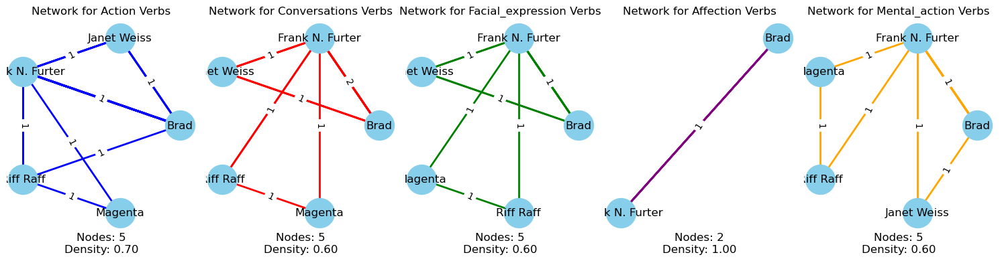

In [7]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt


def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs


def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants


def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text


def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences


def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs


def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text


def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text


text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/11213277.txt'


text = read_text_file(text_file_path)


action_verbs_file = 'verb_cater_1.json'


character_variants_file = 'character_variants_RHPS.json'


action_verbs = load_action_verbs(action_verbs_file)


character_variants = load_character_variants(character_variants_file)


relevant_sentences = extract_relevant_sentences(text, character_variants)


character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)


def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks


def calculate_network_density(network):
    simple_network = nx.Graph(network)  
    density = nx.density(simple_network)
    return density


def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
          
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  
    plt.show()


networks = build_multiedge_network(character_verb_pairs)


visualize_multiedge_networks(networks)


In [156]:
##12090570.txt

[(['Frank N. Furter', 'Magenta', 'Riff Raff'], [('go', 'action')]), (['Eddie', 'Magenta'], [('sleep', 'action'), ('think', 'mental_action')]), (['Frank N. Furter', 'Magenta', 'Riff Raff'], [('break', 'action')]), (['Magenta', 'Riff Raff'], [('work', 'action')]), (['Eddie', 'Frank N. Furter'], [('met', 'action'), ('thought', 'mental_action')]), (['Eddie', 'Magenta', 'Riff Raff'], [('put', 'action')]), (['Eddie', 'Magenta'], [('work', 'action'), ('think', 'mental_action')]), (['Eddie', 'Frank N. Furter', 'Magenta', 'Riff Raff'], [('watch', 'facial_expression'), ('saw', 'action')]), (['Eddie', 'Frank N. Furter', 'Magenta', 'Riff Raff'], [('slam', 'action')]), (['Frank N. Furter', 'Magenta'], [('gave', 'action')]), (['Columbia', 'Magenta'], [('watch', 'facial_expression'), ('sleep', 'action'), ('think', 'mental_action')]), (['Eddie', 'Frank N. Furter'], [('like', 'affection'), ('spending', 'action'), ('miss', 'mental_action')]), (['Magenta', 'Rocky'], [('call', 'conversations'), ('have', '

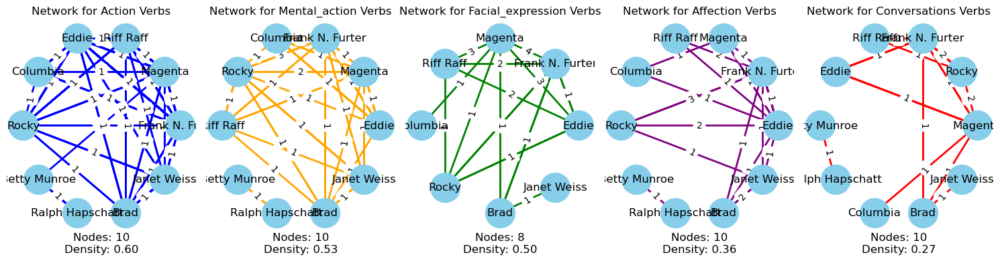

In [8]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt


def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs


def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants


def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text


def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences


def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text


def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text


text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/12090570.txt'


text = read_text_file(text_file_path)


action_verbs_file = 'verb_cater_1.json'


character_variants_file = 'character_variants_RHPS.json'


action_verbs = load_action_verbs(action_verbs_file)


character_variants = load_character_variants(character_variants_file)


relevant_sentences = extract_relevant_sentences(text, character_variants)


character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)


def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks


def calculate_network_density(network):
    simple_network = nx.Graph(network)  
    density = nx.density(simple_network)
    return density


def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
           
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  
    plt.show()


networks = build_multiedge_network(character_verb_pairs)


visualize_multiedge_networks(networks)


In [158]:
##12787710.txt

[(['Frank N. Furter', 'Riff Raff'], [('threaten', 'action')]), (['Magenta', 'Riff Raff'], [('say', 'conversations'), ('talk', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('scream', 'conversations'), ('whip', 'action')]), (['Magenta', 'Riff Raff'], [('go', 'action')]), (['Eddie', 'Frank N. Furter'], [('hold', 'action')]), (['Frank N. Furter', 'Rocky'], [('watch', 'facial_expression'), ('love', 'affection'), ('fell', 'action')]), (['Eddie', 'Frank N. Furter'], [('care', 'affection'), ('knock', 'action')]), (['Eddie', 'Frank N. Furter'], [('saw', 'action')]), (['Frank N. Furter', 'Rocky'], [('plan', 'action')]), (['Frank N. Furter', 'Rocky'], [('watch', 'facial_expression'), ('love', 'affection'), ('move', 'action')]), (['Frank N. Furter', 'Magenta'], [('laugh', 'facial_expression'), ('ask', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('tell', 'conversations'), ('jump', 'action')]), (['Eddie', 'Frank N. Furter', 'Magenta', 'Riff Raff'], [('love', 'affection'), ('go', 'action')])

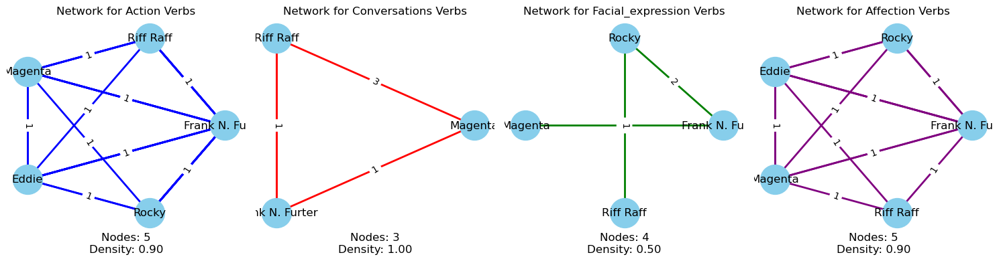

In [9]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt


def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs


def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants


def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text


def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences


def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs


def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text


def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text


text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/12787710.txt'


text = read_text_file(text_file_path)


action_verbs_file = 'verb_cater_1.json'


character_variants_file = 'character_variants_RHPS.json'


action_verbs = load_action_verbs(action_verbs_file)


character_variants = load_character_variants(character_variants_file)


relevant_sentences = extract_relevant_sentences(text, character_variants)


character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)


def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks


def calculate_network_density(network):
    simple_network = nx.Graph(network)  
    density = nx.density(simple_network)
    return density


def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout() 
    plt.show()


networks = build_multiedge_network(character_verb_pairs)


visualize_multiedge_networks(networks)


In [160]:
##13917528.txt

[(['Frank N. Furter', 'Rocky'], [('call', 'conversations'), ('watch', 'facial_expression'), ('love', 'affection'), ('try', 'action'), ('need', 'mental_action')]), (['Janet Weiss', 'Rocky'], [('smile', 'facial_expression'), ('turn', 'action'), ('wonder', 'mental_action')]), (['Magenta', 'Riff Raff'], [('whisper', 'conversations'), ('met', 'action')]), (['Frank N. Furter', 'Magenta'], [('smile', 'facial_expression'), ('like', 'affection'), ('take', 'action'), ('think', 'mental_action')]), (['Frank N. Furter', 'Magenta', 'Riff Raff'], [('laugh', 'facial_expression'), ('care', 'affection'), ('fall', 'action'), ('feel', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('laugh', 'facial_expression'), ('pick', 'action'), ('need', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('call', 'conversations'), ('love', 'affection'), ('take', 'action'), ('notice', 'mental_action')]), (['Columbia', 'Frank N. Furter', 'Magenta', 'Riff Raff'], [('ask', 'action'), ('notice', 'mental_action')

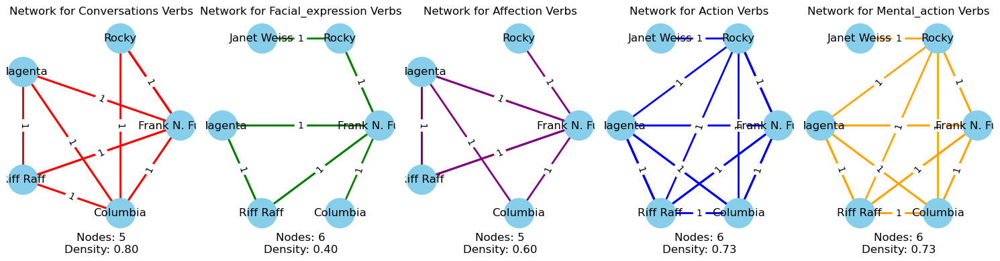

In [10]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt


def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs


def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants


def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text


def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences


def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs


def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text


def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text


text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/13917528.txt'


text = read_text_file(text_file_path)


action_verbs_file = 'verb_cater_1.json'


character_variants_file = 'character_variants_RHPS.json'


action_verbs = load_action_verbs(action_verbs_file)


character_variants = load_character_variants(character_variants_file)


relevant_sentences = extract_relevant_sentences(text, character_variants)


character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)


def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks


def calculate_network_density(network):
    simple_network = nx.Graph(network)  
    density = nx.density(simple_network)
    return density


def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

           
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  
    plt.show()


networks = build_multiedge_network(character_verb_pairs)


visualize_multiedge_networks(networks)


In [162]:
##13979313.txt

[(['Riff Raff', 'Rocky'], [('play', 'action')]), (['Columbia', 'Frank N. Furter'], [('call', 'conversations'), ('act', 'action')]), (['Eddie', 'Frank N. Furter'], [('think', 'mental_action')]), (['Columbia', 'Eddie', 'Frank N. Furter'], [('say', 'conversations'), ('leave', 'action')]), (['Eddie', 'Frank N. Furter'], [('say', 'conversations'), ('cast', 'action')]), (['Eddie', 'Frank N. Furter'], [('say', 'conversations'), ('like', 'affection'), ('met', 'action')]), (['Columbia', 'Eddie'], [('like', 'affection'), ('shudder', 'action'), ('thought', 'mental_action')]), (['Eddie', 'Frank N. Furter'], [('ask', 'action')]), (['Eddie', 'Frank N. Furter'], [('say', 'conversations'), ('smile', 'facial_expression'), ('like', 'affection'), ('play', 'action'), ('feel', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('leave', 'action')]), (['Eddie', 'Frank N. Furter', 'Riff Raff'], [('scream', 'conversations'), ('laugh', 'facial_expression'), ('turn', 'action')]), (['Frank N. Furter', 'Riff

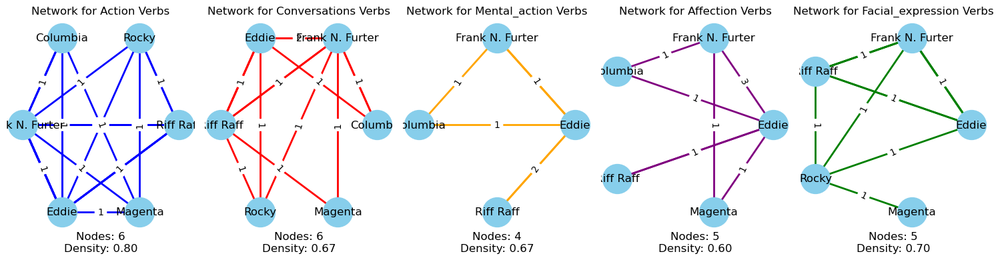

In [11]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt


def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs


def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants


def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text


def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences


def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs


def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text


def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text


text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/13979313.txt'


text = read_text_file(text_file_path)


action_verbs_file = 'verb_cater_1.json'


character_variants_file = 'character_variants_RHPS.json'


action_verbs = load_action_verbs(action_verbs_file)


character_variants = load_character_variants(character_variants_file)


relevant_sentences = extract_relevant_sentences(text, character_variants)


character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)


def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks


def calculate_network_density(network):
    simple_network = nx.Graph(network)  
    density = nx.density(simple_network)
    return density


def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  
    plt.show()


networks = build_multiedge_network(character_verb_pairs)


visualize_multiedge_networks(networks)


In [164]:
##1409260.txt

[(['Brad', 'Frank N. Furter'], [('fuck', 'action')]), (['Brad', 'Janet Weiss'], [('like', 'affection'), ('drawl', 'action')]), (['Brad', 'Frank N. Furter'], [('sigh', 'conversations'), ('sleep', 'action')]), (['Columbia', 'Frank N. Furter', 'Rocky'], [('love', 'affection')]), (['Magenta', 'Riff Raff'], [('love', 'affection'), ('kill', 'action'), ('thought', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('cry', 'facial_expression'), ('love', 'affection'), ('fall', 'action')]), (['Brad', 'Frank N. Furter'], [('say', 'conversations'), ('make', 'action'), ('make', 'mental_action')]), (['Frank N. Furter', 'Rocky'], [('fuck', 'action')]), (['Brad', 'Janet Weiss'], [('met', 'action'), ('dream', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('ask', 'action')]), (['Brad', 'Janet Weiss'], [('say', 'conversations'), ('hear', 'action')]), (['Brad', 'Janet Weiss'], [('pull', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('like', 'affection'), ('face', 'action'), ('feel', 'ment

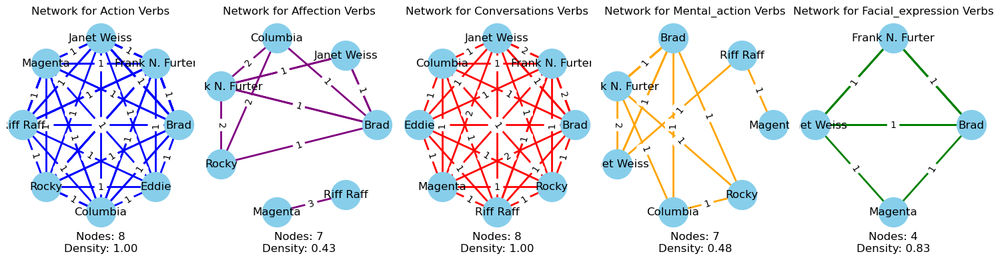

In [12]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt


def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs


def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants


def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text


def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences


def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs


def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text


def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text


text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/1409260.txt'


text = read_text_file(text_file_path)


action_verbs_file = 'verb_cater_1.json'

character_variants_file = 'character_variants_RHPS.json'


action_verbs = load_action_verbs(action_verbs_file)


character_variants = load_character_variants(character_variants_file)


relevant_sentences = extract_relevant_sentences(text, character_variants)


character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)


def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks


def calculate_network_density(network):
    simple_network = nx.Graph(network)  
    density = nx.density(simple_network)
    return density


def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout() 
    plt.show()


networks = build_multiedge_network(character_verb_pairs)


visualize_multiedge_networks(networks)


In [166]:
##14427576.txt

[(['Columbia', 'Frank N. Furter'], [('grin', 'facial_expression'), ('take', 'action')]), (['Columbia', 'Frank N. Furter'], [('answer', 'conversations'), ('like', 'affection'), ('cast', 'action'), ('wonder', 'mental_action')]), (['Columbia', 'Frank N. Furter'], [('answer', 'conversations'), ('nod', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('walk', 'action')]), (['Columbia', 'Frank N. Furter'], [('smile', 'facial_expression'), ('follow', 'action')]), (['Columbia', 'Frank N. Furter', 'Magenta'], [('blush', 'facial_expression'), ('drop', 'action')]), (['Columbia', 'Frank N. Furter', 'Magenta'], [('cast', 'action')]), (['Columbia', 'Magenta'], [('keep', 'action')]), (['Columbia', 'Frank N. Furter'], [('grin', 'facial_expression'), ('shrug', 'action'), ('guess', 'mental_action')]), (['Columbia', 'Frank N. Furter'], [('ask', 'action'), ('think', 'mental_action')]), (['Columbia', 'Frank N. Furter'], [('tell', 'conversations'), ('ask', 'action'), ('feel', 'mental_action')]), (['Frank N.

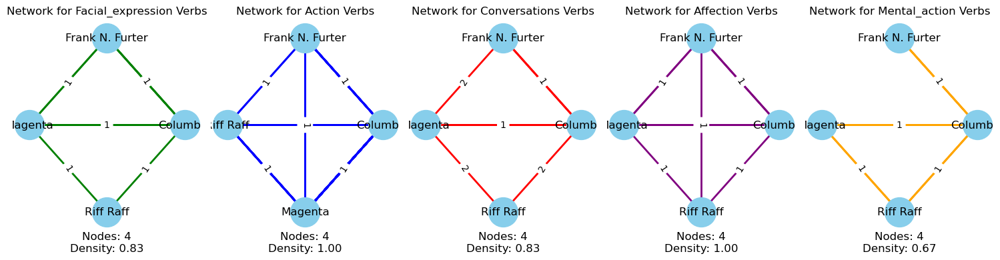

In [13]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt


def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs


def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants


def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text


def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences


def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs


def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text


def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text


text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/14427576.txt'


text = read_text_file(text_file_path)


action_verbs_file = 'verb_cater_1.json'


character_variants_file = 'character_variants_RHPS.json'


action_verbs = load_action_verbs(action_verbs_file)


character_variants = load_character_variants(character_variants_file)


relevant_sentences = extract_relevant_sentences(text, character_variants)


character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)


def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks


def calculate_network_density(network):
    simple_network = nx.Graph(network) 
    density = nx.density(simple_network)
    return density


def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  
    plt.show()


networks = build_multiedge_network(character_verb_pairs)


visualize_multiedge_networks(networks)


In [168]:
##14718293.txt

[(['Columbia', 'Magenta'], [('try', 'action')]), (['Columbia', 'Frank N. Furter', 'Magenta', 'Riff Raff'], [('say', 'conversations'), ('talk', 'action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('call', 'conversations'), ('talk', 'action')]), (['Eddie', 'Frank N. Furter'], [('pick', 'action')]), (['Frank N. Furter', 'Magenta'], [('love', 'affection'), ('take', 'action')]), (['Magenta', 'Riff Raff'], [('take', 'action')]), (['Brad', 'Frank N. Furter'], [('stand', 'action')]), (['Brad', 'Columbia', 'Frank N. Furter', 'Janet Weiss'], [('tell', 'conversations'), ('turn', 'action'), ('respect', 'mental_action')]), (['Eddie', 'Frank N. Furter'], [('offer', 'action')]), (['Brad', 'Columbia', 'Eddie', 'Frank N. Furter', 'Janet Weiss'], [('scream', 'conversations'), ('talk', 'action')]), (['Eddie', 'Frank N. Furter'], [('pull', 'action')]), (['Brad', 'Janet Weiss'], [('win', 'action')]), (['Magenta', 'Riff Raff'], [('leave', 'action')]), (['Frank N. Furter', 'Magenta'], [('turn', 'actio

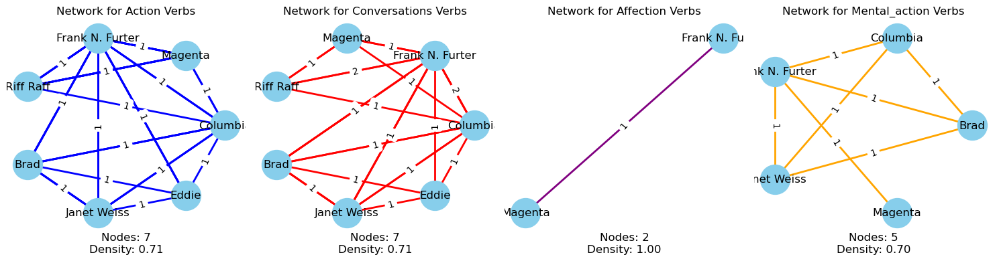

In [14]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt


def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs


def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants


def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text


def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences


def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs


def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text


def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text


text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/14718293.txt'


text = read_text_file(text_file_path)


action_verbs_file = 'verb_cater_1.json'


character_variants_file = 'character_variants_RHPS.json'


action_verbs = load_action_verbs(action_verbs_file)


character_variants = load_character_variants(character_variants_file)


relevant_sentences = extract_relevant_sentences(text, character_variants)

character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)


def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

def calculate_network_density(network):
    simple_network = nx.Graph(network)  
    density = nx.density(simple_network)
    return density


def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout() 
    plt.show()

networks = build_multiedge_network(character_verb_pairs)


visualize_multiedge_networks(networks)


In [170]:
##1578.txt

[(['Magenta', 'Riff Raff'], [('call', 'conversations'), ('act', 'action')]), (['Frank N. Furter', 'Magenta', 'Riff Raff'], [('tell', 'conversations'), ('know', 'action')]), (['Columbia', 'Magenta'], [('go', 'action')]), (['Columbia', 'Frank N. Furter'], [('murmur', 'conversations'), ('close', 'action')]), (['Columbia', 'Magenta'], [('take', 'action'), ('make', 'mental_action')]), (['Magenta', 'Riff Raff'], [('chuckle', 'facial_expression'), ('ask', 'action')]), (['Columbia', 'Frank N. Furter', 'Magenta'], [('call', 'conversations'), ('do', 'action')]), (['Columbia', 'Magenta'], [('handle', 'action'), ('thought', 'mental_action')]), (['Columbia', 'Frank N. Furter'], [('care', 'affection'), ('ask', 'action'), ('need', 'mental_action')]), (['Columbia', 'Frank N. Furter'], [('call', 'conversations'), ('stare', 'facial_expression'), ('hang', 'action'), ('thought', 'mental_action')]), (['Columbia', 'Magenta'], [('mutter', 'facial_expression'), ('pass', 'action')]), (['Columbia', 'Magenta'], 

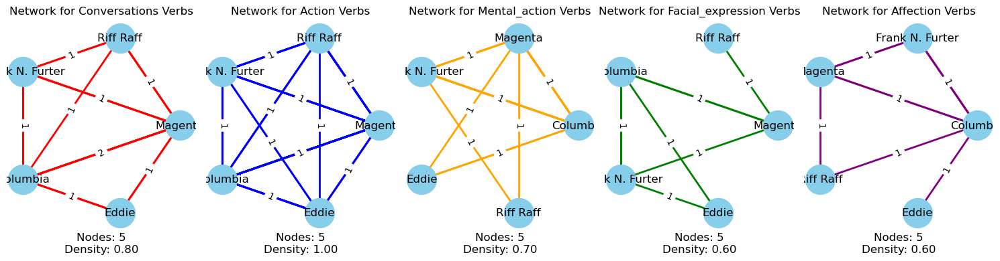

In [15]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt


def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs


def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants


def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text


def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences


def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs


def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text


def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text


text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/1578.txt'


text = read_text_file(text_file_path)


action_verbs_file = 'verb_cater_1.json'


character_variants_file = 'character_variants_RHPS.json'


action_verbs = load_action_verbs(action_verbs_file)


character_variants = load_character_variants(character_variants_file)


relevant_sentences = extract_relevant_sentences(text, character_variants)


character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)


def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks


def calculate_network_density(network):
    simple_network = nx.Graph(network) 
    density = nx.density(simple_network)
    return density


def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4)) 

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
           
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

           
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  
    plt.show()


networks = build_multiedge_network(character_verb_pairs)


visualize_multiedge_networks(networks)


In [172]:
##1579100.txt

[(['Columbia', 'Janet Weiss', 'Magenta', 'Rocky'], [('go', 'action')]), (['Frank N. Furter', 'Riff Raff', 'Rocky'], [('go', 'action')]), (['Brad', 'Janet Weiss'], [('met', 'action'), ('hit', 'mental_action')]), (['Magenta', 'Riff Raff'], [('stand', 'action')]), (['Janet Weiss', 'Rocky'], [('love', 'affection'), ('hang', 'action')]), (['Janet Weiss', 'Rocky'], [('come', 'action')]), (['Columbia', 'Janet Weiss', 'Magenta'], [('tell', 'conversations'), ('saw', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('mention', 'conversations'), ('love', 'affection')])]


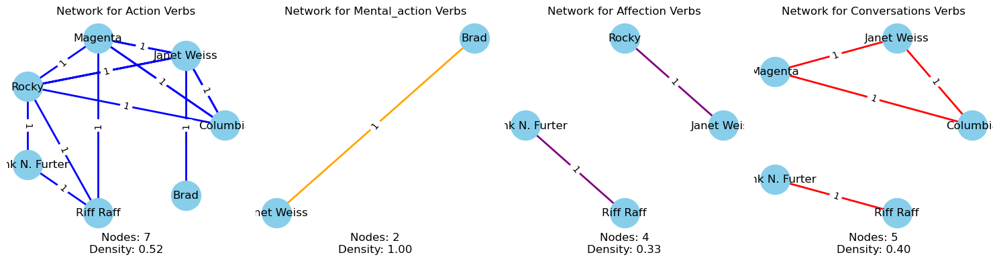

In [16]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt


def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs


def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants


def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text


def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences


def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs


def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text


def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text


text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/1579100.txt'


text = read_text_file(text_file_path)


action_verbs_file = 'verb_cater_1.json'


character_variants_file = 'character_variants_RHPS.json'


action_verbs = load_action_verbs(action_verbs_file)


character_variants = load_character_variants(character_variants_file)


relevant_sentences = extract_relevant_sentences(text, character_variants)


character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)


def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks


def calculate_network_density(network):
    simple_network = nx.Graph(network)  
    density = nx.density(simple_network)
    return density


def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
           
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

          
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  
    plt.show()


networks = build_multiedge_network(character_verb_pairs)


visualize_multiedge_networks(networks)


In [174]:
##15950534.txt

[(['Magenta', 'Riff Raff'], [('mumble', 'facial_expression'), ('like', 'affection'), ('open', 'action')]), (['Magenta', 'Riff Raff'], [('control', 'action')]), (['Columbia', 'Magenta', 'Riff Raff'], [('call', 'conversations'), ('kiss', 'affection'), ('met', 'action')]), (['Columbia', 'Magenta'], [('have', 'action'), ('need', 'mental_action')]), (['Columbia', 'Magenta'], [('ask', 'action')]), (['Columbia', 'Eddie', 'Frank N. Furter'], [('smile', 'facial_expression'), ('ask', 'action'), ('need', 'mental_action')]), (['Columbia', 'Magenta'], [('kiss', 'affection'), ('play', 'action')]), (['Magenta', 'Riff Raff'], [('dusting', 'action')]), (['Magenta', 'Riff Raff'], [('laugh', 'facial_expression'), ('kiss', 'affection'), ('ask', 'action')]), (['Frank N. Furter', 'Magenta'], [('roll', 'action')]), (['Columbia', 'Magenta', 'Riff Raff'], [('watch', 'facial_expression'), ('hear', 'action')]), (['Magenta', 'Riff Raff'], [('watch', 'facial_expression'), ('grind', 'action')]), (['Frank N. Furter'

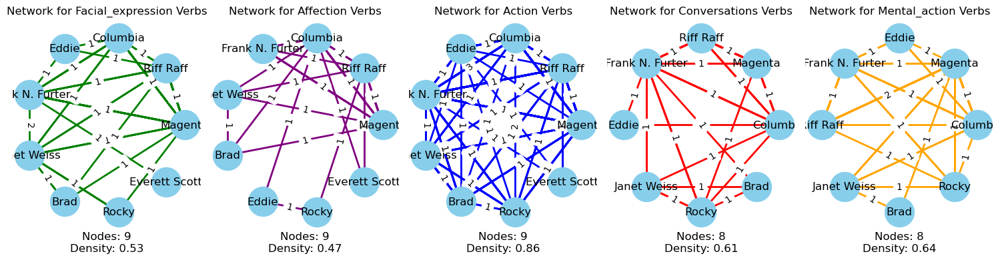

In [17]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt


def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants


def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text


def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences


def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs


def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text


def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text


text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/15950534.txt'


text = read_text_file(text_file_path)


action_verbs_file = 'verb_cater_1.json'


character_variants_file = 'character_variants_RHPS.json'


action_verbs = load_action_verbs(action_verbs_file)


character_variants = load_character_variants(character_variants_file)


relevant_sentences = extract_relevant_sentences(text, character_variants)


character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)


def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks


def calculate_network_density(network):
    simple_network = nx.Graph(network)  
    density = nx.density(simple_network)
    return density


def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4)) 

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
         
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

          
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  
    plt.show()


networks = build_multiedge_network(character_verb_pairs)


visualize_multiedge_networks(networks)


In [176]:
##1749797.txt

[(['Columbia', 'Eddie', 'Magenta', 'Riff Raff'], [('sing', 'action')]), (['Magenta', 'Riff Raff'], [('met', 'action'), ('need', 'mental_action')]), (['Frank N. Furter', 'Magenta', 'Riff Raff'], [('sigh', 'conversations'), ('sit', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('watch', 'facial_expression'), ('care', 'affection'), ('act', 'action'), ('guess', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('exclaim', 'conversations'), ('like', 'affection'), ('move', 'action'), ('believe', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('lean', 'facial_expression'), ('turn', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('raise', 'action'), ('need', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('stare', 'facial_expression'), ('like', 'affection'), ('met', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('met', 'action'), ('regret', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('act', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('do', 'ac

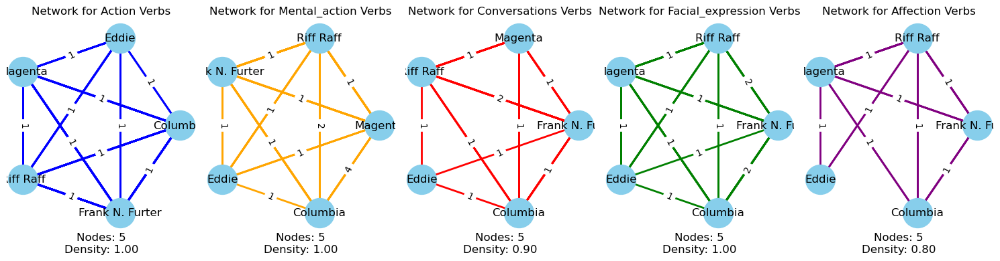

In [18]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/1749797.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [178]:
##18528691.txt

[(['Brad', 'Frank N. Furter', 'Janet Weiss'], [('love', 'affection'), ('write', 'action'), ('thought', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('care', 'affection'), ('ask', 'action'), ('wish', 'mental_action')]), (['Brad', 'Janet Weiss'], [('watch', 'facial_expression'), ('like', 'affection'), ('face', 'action'), ('remember', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('call', 'conversations'), ('cry', 'facial_expression'), ('care', 'affection'), ('try', 'action'), ('regret', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('moan', 'facial_expression'), ('love', 'affection'), ('met', 'action'), ('feel', 'mental_action')])]


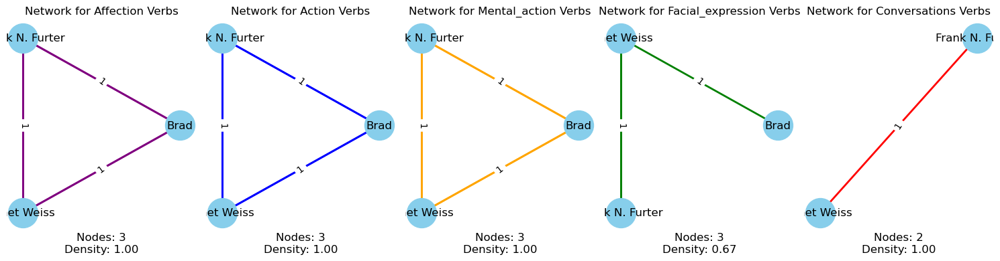

In [19]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/18528691.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [180]:
##19183975.txt

[(['Magenta', 'Riff Raff'], [('answer', 'conversations'), ('like', 'affection'), ('know', 'action'), ('thought', 'mental_action')]), (['Magenta', 'Riff Raff'], [('take', 'action')]), (['Columbia', 'Magenta'], [('like', 'affection')]), (['Columbia', 'Magenta'], [('like', 'affection'), ('pick', 'action')]), (['Columbia', 'Magenta', 'Riff Raff'], [('know', 'action')]), (['Columbia', 'Magenta'], [('like', 'affection'), ('turn', 'action')])]


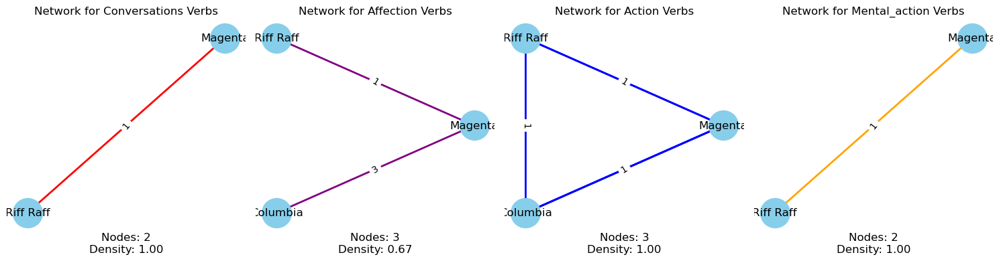

In [20]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/19183975.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [182]:
##19480177.txt

[(['Magenta', 'Riff Raff'], [('love', 'affection')]), (['Magenta', 'Riff Raff'], [('kiss', 'affection'), ('act', 'action')]), (['Magenta', 'Riff Raff'], [('take', 'action'), ('miss', 'mental_action')]), (['Frank N. Furter', 'Magenta', 'Riff Raff'], [('growl', 'conversations'), ('turn', 'action'), ('remember', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('laugh', 'facial_expression'), ('love', 'affection'), ('talk', 'action'), ('wish', 'mental_action')]), (['Frank N. Furter', 'Magenta', 'Riff Raff'], [('like', 'affection'), ('squeeze', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('take', 'action')]), (['Frank N. Furter', 'Magenta', 'Riff Raff'], [('sing', 'action'), ('think', 'mental_action')]), (['Magenta', 'Riff Raff'], [('stare', 'facial_expression'), ('command', 'action'), ('miss', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('turn', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('say', 'conversations'), ('walk', 'action'), ('think', 'mental_action')]

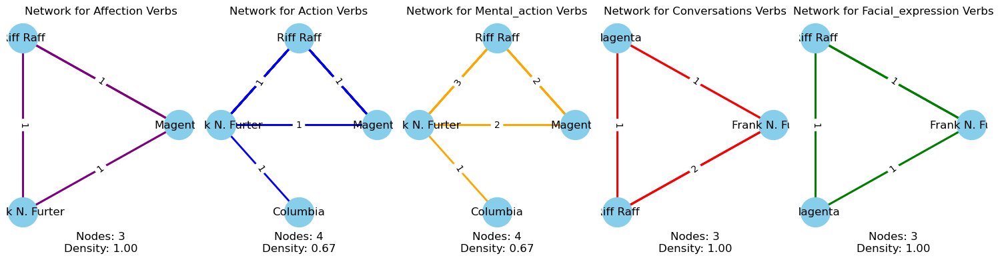

In [21]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/19480177.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [184]:
##20649923.txt

[(['Brad', 'Janet Weiss'], [('met', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('love', 'affection'), ('hang', 'action')]), (['Betty Munroe', 'Ralph Hapschatt'], [('talk', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('do', 'action')]), (['Brad', 'Frank N. Furter'], [('like', 'affection'), ('cover', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('call', 'conversations'), ('grab', 'action'), ('feel', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('like', 'affection'), ('go', 'action'), ('feel', 'mental_action')]), (['Frank N. Furter', 'Rocky'], [('call', 'conversations'), ('laugh', 'facial_expression')]), (['Brad', 'Rocky'], [('like', 'affection'), ('talk', 'action')]), (['Columbia', 'Frank N. Furter', 'Rocky'], [('comment', 'conversations'), ('ask', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('like', 'affection'), ('turn', 'action')]), (['Brad', 'Frank N. Furter', 'Rocky'], [('watch', 'facial_expression'), ('love', 'affection'), ('do', 'action')])

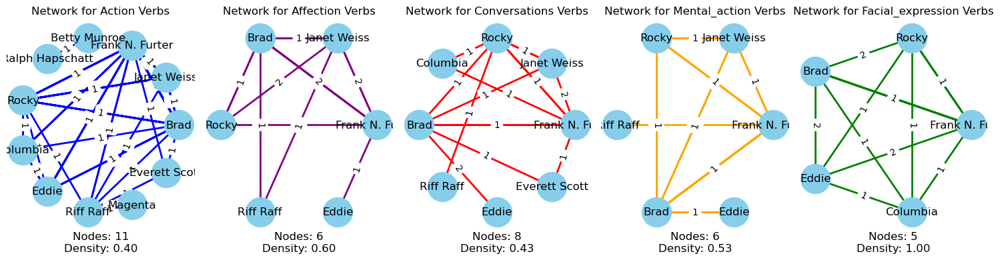

In [22]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/20649923.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [186]:
##20841947_txt.txt

[(['Brad', 'Frank N. Furter', 'Rocky'], [('sing', 'action')]), (['Brad', 'Frank N. Furter'], [('sing', 'action')]), (['Brad', 'Janet Weiss'], [('say', 'conversations'), ('have', 'action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss', 'Ralph Hapschatt'], [('met', 'action'), ('thought', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('met', 'action')]), (['Brad', 'Frank N. Furter'], [('do', 'action')]), (['Brad', 'Frank N. Furter'], [('cry', 'facial_expression'), ('close', 'action')]), (['Brad', 'Frank N. Furter'], [('whimper', 'facial_expression'), ('kiss', 'affection'), ('taste', 'action'), ('surprise', 'mental_action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('face', 'action'), ('wonder', 'mental_action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('bit', 'action')]), (['Brad', 'Frank N. Furter'], [('push', 'action')]), (['Brad', 'Frank N. Furter'], [('try', 'action'), ('demand', 'mental_action')]), (['Brad', 'Janet Weiss'], [('say', 'conversations')]), (['Brad', '

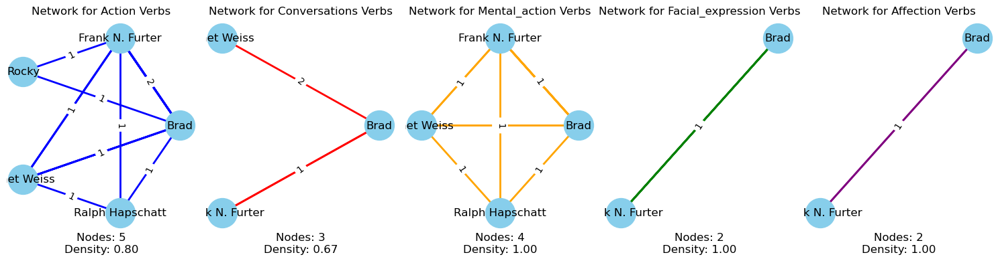

In [23]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/20841947_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [188]:
##21680740.txt

[(['Magenta', 'Rocky'], [('love', 'affection'), ('saw', 'action')]), (['Columbia', 'Magenta'], [('love', 'affection'), ('put', 'action')]), (['Columbia', 'Magenta'], [('like', 'affection'), ('met', 'action')]), (['Frank N. Furter', 'Magenta'], [('play', 'action')]), (['Magenta', 'Riff Raff'], [('take', 'action')]), (['Frank N. Furter', 'Magenta'], [('say', 'conversations'), ('win', 'action'), ('make', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('tell', 'conversations'), ('like', 'affection'), ('stand', 'action')]), (['Frank N. Furter', 'Magenta'], [('watch', 'facial_expression'), ('kiss', 'affection'), ('roll', 'action'), ('thought', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('turn', 'action')]), (['Magenta', 'Riff Raff'], [('chuckle', 'facial_expression'), ('spoke', 'action')]), (['Frank N. Furter', 'Magenta'], [('turn', 'action'), ('hit', 'mental_action')]), (['Frank N. Furter', 'Magenta', 'Riff Raff'], [('lean', 'facial_expression'), ('hold', 'action')]), (['F

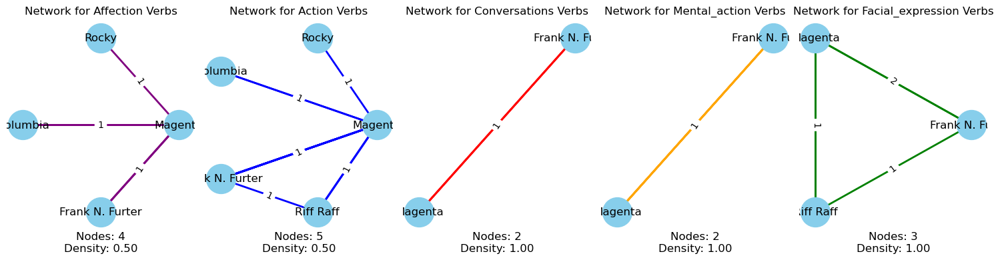

In [24]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/21680740.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [190]:
##22262287.txt

[(['Brad', 'Frank N. Furter', 'Janet Weiss'], [('have', 'action'), ('consider', 'mental_action')])]


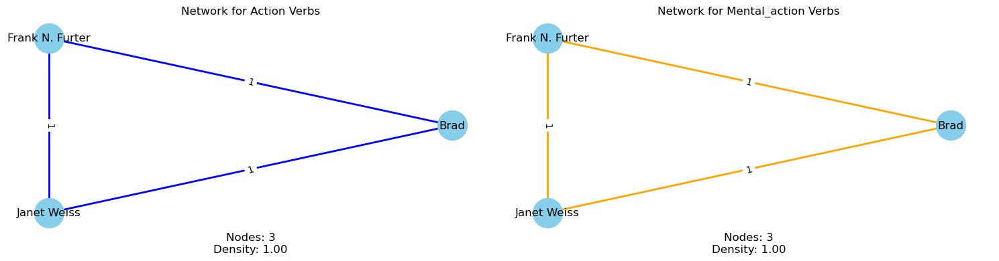

In [25]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/22262287.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [192]:
##23080390.txt

[(['Columbia', 'Magenta'], [('say', 'conversations'), ('watch', 'facial_expression'), ('take', 'action'), ('think', 'mental_action')]), (['Columbia', 'Magenta'], [('smile', 'facial_expression'), ('like', 'affection'), ('sit', 'action'), ('feel', 'mental_action')])]


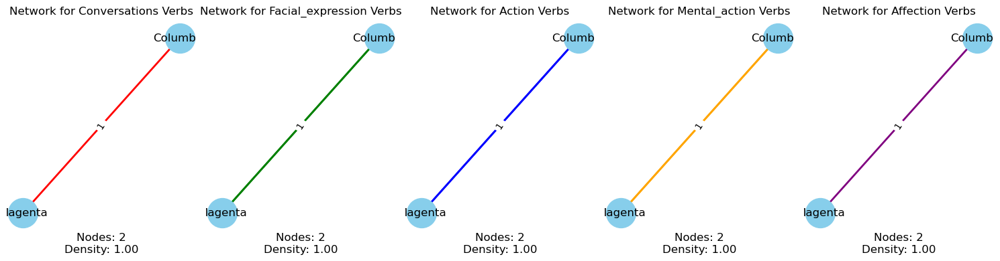

In [26]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/23080390.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [194]:
##2484962.txt

[(['Magenta', 'Riff Raff'], [('nod', 'action')]), (['Frank N. Furter', 'Magenta'], [('spoke', 'action')]), (['Magenta', 'Riff Raff'], [('act', 'action')]), (['Frank N. Furter', 'Magenta', 'Riff Raff'], [('thank', 'affection')]), (['Frank N. Furter', 'Magenta', 'Riff Raff'], [('whisper', 'conversations'), ('nod', 'action'), ('wonder', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('need', 'mental_action')]), (['Frank N. Furter', 'Magenta', 'Riff Raff'], [('whisper', 'conversations'), ('smirk', 'facial_expression'), ('ask', 'action')]), (['Frank N. Furter', 'Magenta'], [('pull', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('say', 'conversations'), ('watch', 'facial_expression'), ('like', 'affection'), ('work', 'action'), ('think', 'mental_action')]), (['Frank N. Furter', 'Magenta', 'Riff Raff'], [('smirk', 'facial_expression'), ('like', 'affection'), ('take', 'action')]), (['Frank N. Furter', 'Magenta'], [('call', 'conversations'), ('play', 'action'), ('hate', 'mental_action

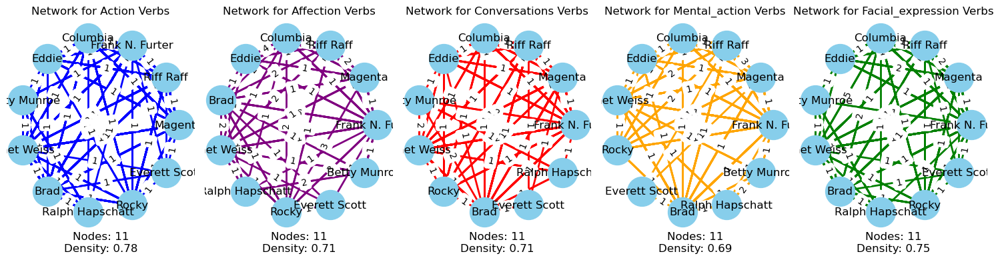

In [27]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/2484962.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [196]:
##2662625.txt

[(['Frank N. Furter', 'Rocky'], [('pull', 'action')]), (['Frank N. Furter', 'Rocky'], [('go', 'action')]), (['Frank N. Furter', 'Rocky'], [('say', 'conversations'), ('smirk', 'facial_expression'), ('like', 'affection'), ('act', 'action')])]


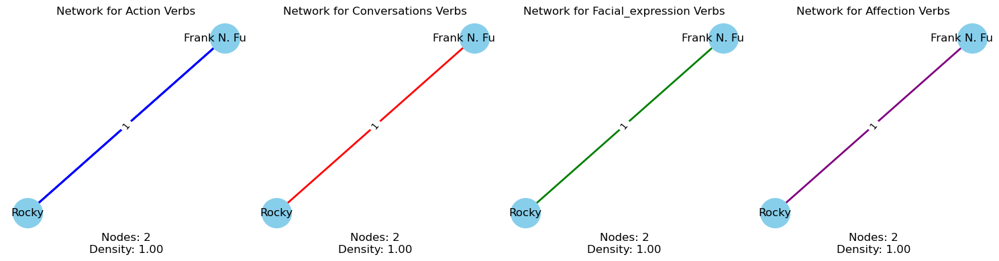

In [28]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/2662625.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [198]:
##27580583.txt

[(['Betty Munroe', 'Ralph Hapschatt'], [('take', 'action')]), (['Brad', 'Janet Weiss'], [('love', 'affection'), ('do', 'action')]), (['Betty Munroe', 'Ralph Hapschatt'], [('call', 'conversations'), ('kiss', 'affection')]), (['Betty Munroe', 'Janet Weiss'], [('giggle', 'facial_expression'), ('do', 'action'), ('believe', 'mental_action')]), (['Betty Munroe', 'Janet Weiss'], [('smile', 'facial_expression'), ('pull', 'action'), ('feel', 'mental_action')]), (['Brad', 'Janet Weiss', 'Ralph Hapschatt'], [('saw', 'action')]), (['Brad', 'Ralph Hapschatt'], [('saw', 'action')]), (['Betty Munroe', 'Janet Weiss'], [('turn', 'action')]), (['Betty Munroe', 'Janet Weiss'], [('go', 'action')]), (['Betty Munroe', 'Ralph Hapschatt'], [('pull', 'action')]), (['Brad', 'Betty Munroe', 'Janet Weiss'], [('wonder', 'mental_action')]), (['Brad', 'Janet Weiss', 'Ralph Hapschatt'], [('sigh', 'conversations'), ('glance', 'facial_expression'), ('saw', 'action')]), (['Betty Munroe', 'Janet Weiss'], [('roll', 'actio

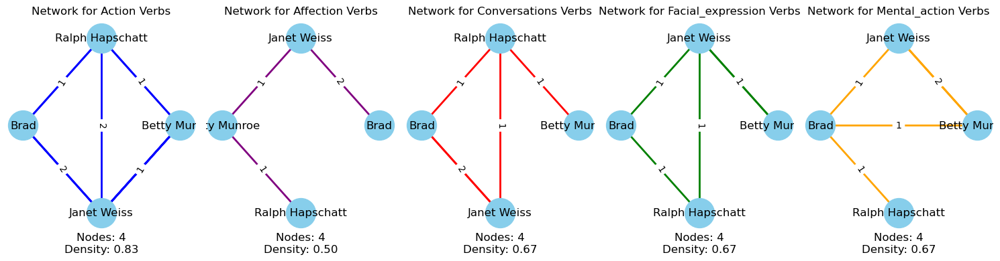

In [29]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/27580583.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [200]:
##27626326.txt

[(['Columbia', 'Magenta', 'Riff Raff'], [('win', 'action')]), (['Columbia', 'Magenta', 'Riff Raff'], [('toss', 'action'), ('make', 'mental_action')]), (['Columbia', 'Magenta'], [('groan', 'conversations'), ('turn', 'action')]), (['Magenta', 'Riff Raff'], [('take', 'action')]), (['Eddie', 'Frank N. Furter', 'Magenta', 'Riff Raff'], [('play', 'action'), ('decide', 'mental_action')])]


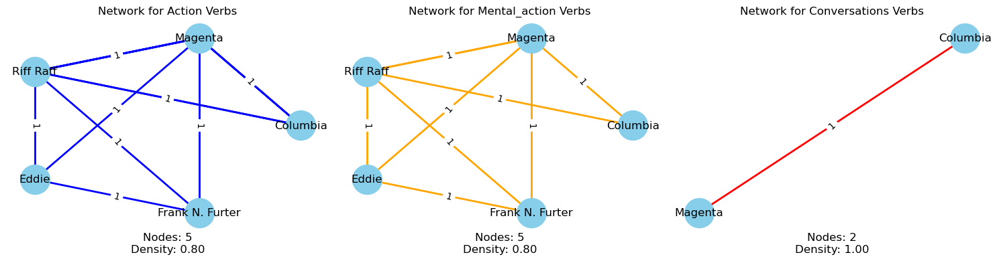

In [30]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/27626326.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [202]:
##27658573.txt

[(['Brad', 'Janet Weiss'], [('spoke', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('sniffle', 'facial_expression'), ('love', 'affection'), ('face', 'action')]), (['Frank N. Furter', 'Rocky'], [('like', 'affection'), ('spoke', 'action'), ('feel', 'mental_action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('ask', 'action'), ('guess', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('rub', 'action')]), (['Brad', 'Janet Weiss'], [('grab', 'action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('nod', 'action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('pull', 'action')]), (['Brad', 'Janet Weiss'], [('face', 'action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('frown', 'facial_expression'), ('nod', 'action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('smile', 'facial_expression'), ('grab', 'action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('care', 'affection'), ('take', 'action')]), (['Brad', 'Janet Weiss'], [('close', 'action')]), (['Brad

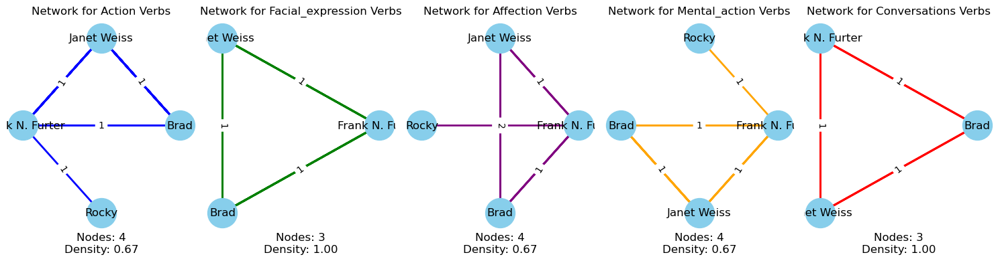

In [31]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/27658573.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [204]:
##28063239.txt

[(['Brad', 'Janet Weiss'], [('kiss', 'affection'), ('drive', 'action')]), (['Brad', 'Janet Weiss'], [('met', 'action')]), (['Brad', 'Janet Weiss'], [('groan', 'conversations'), ('have', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('sing', 'action'), ('dream', 'mental_action')]), (['Brad', 'Janet Weiss'], [('fall', 'action')])]


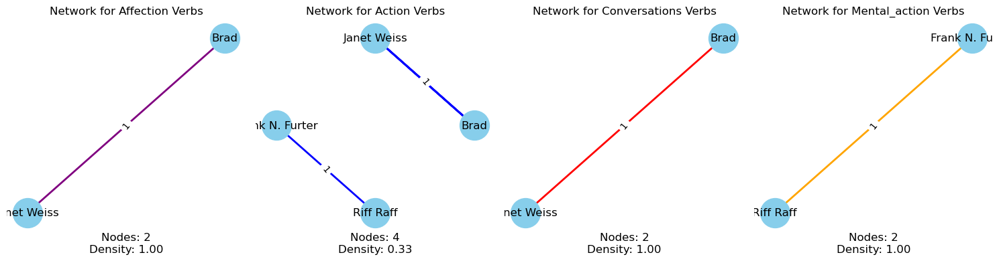

In [32]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/28063239.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [206]:
##2808269.txt

[(['Brad', 'Janet Weiss'], [('go', 'action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss', 'Rocky'], [('like', 'affection'), ('hold', 'action')]), (['Brad', 'Frank N. Furter'], [('touch', 'action')]), (['Brad', 'Frank N. Furter'], [('answer', 'conversations'), ('give', 'action')]), (['Brad', 'Riff Raff'], [('wink', 'facial_expression'), ('play', 'action')])]


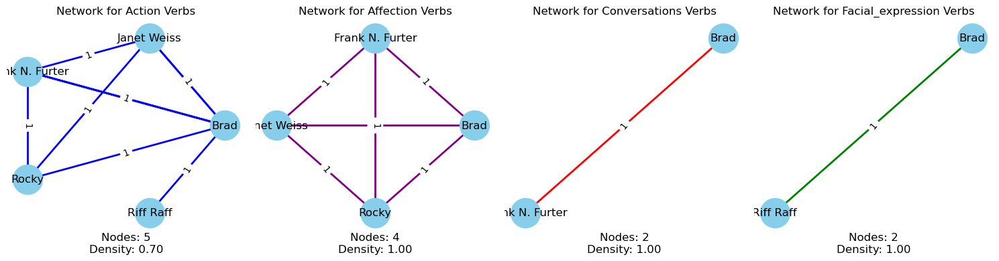

In [33]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/2808269.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [208]:
##28809600.txt

[(['Frank N. Furter', 'Magenta'], [('stare', 'facial_expression'), ('like', 'affection'), ('keep', 'action'), ('need', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('glare', 'facial_expression'), ('sing', 'action'), ('miss', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('turn', 'action')]), (['Frank N. Furter', 'Magenta'], [('kill', 'action')]), (['Frank N. Furter', 'Magenta'], [('hold', 'action'), ('hate', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('met', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('met', 'action')]), (['Columbia', 'Frank N. Furter'], [('say', 'conversations'), ('sit', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('say', 'conversations'), ('turn', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('say', 'conversations'), ('care', 'affection'), ('take', 'action')]), (['Magenta', 'Riff Raff'], [('fuck', 'action')]), (['Magenta', 'Riff Raff'], [('answer', 'conversations'), ('glare', 'facial_expression')]), (['Magenta', 'Riff Raff']

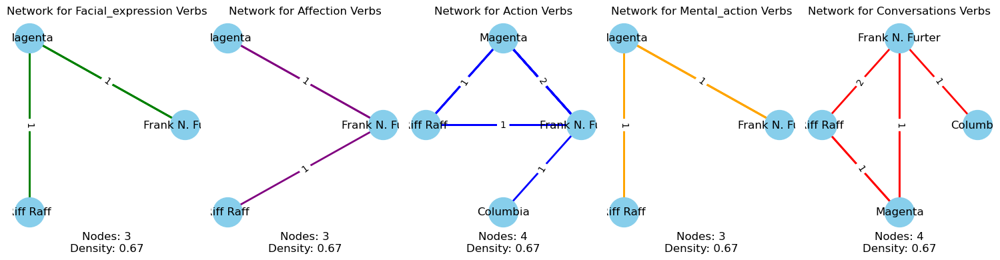

In [34]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/28809600.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [210]:
##28950279_txt.txt

[(['Brad', 'Frank N. Furter'], [('kiss', 'affection'), ('sing', 'action'), ('notice', 'mental_action')]), (['Brad', 'Betty Munroe'], [('go', 'action')])]


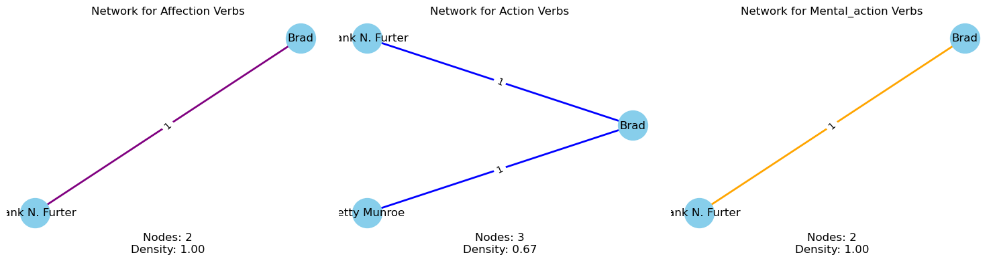

In [35]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/28950279_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [212]:
##29058837.txt

[(['Brad', 'Frank N. Furter'], [('like', 'affection'), ('play', 'action')])]


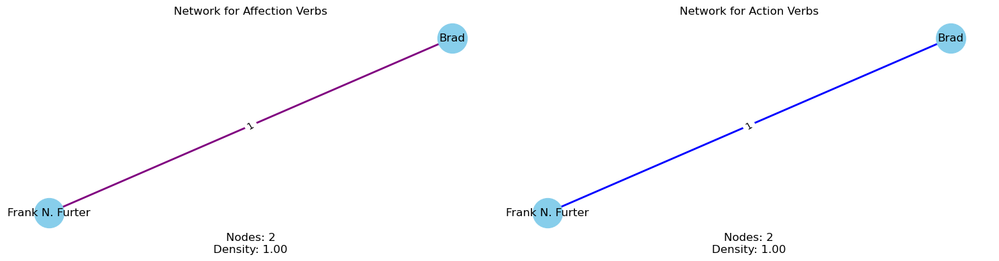

In [36]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/29058837.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [214]:
##29608974.txt

[(['Brad', 'Janet Weiss'], [('met', 'action')]), (['Brad', 'Janet Weiss', 'Riff Raff'], [('saw', 'action'), ('wanna', 'mental_action')]), (['Brad', 'Betty Munroe', 'Janet Weiss', 'Ralph Hapschatt'], [('like', 'affection'), ('face', 'action'), ('hit', 'mental_action')]), (['Betty Munroe', 'Ralph Hapschatt'], [('laugh', 'facial_expression')]), (['Betty Munroe', 'Ralph Hapschatt'], [('smirk', 'facial_expression'), ('talk', 'action'), ('notice', 'mental_action')]), (['Betty Munroe', 'Janet Weiss'], [('sing', 'action')]), (['Brad', 'Janet Weiss'], [('like', 'affection'), ('come', 'action'), ('feel', 'mental_action')]), (['Brad', 'Janet Weiss', 'Ralph Hapschatt'], [('tell', 'conversations'), ('like', 'affection'), ('sing', 'action')]), (['Brad', 'Janet Weiss', 'Ralph Hapschatt'], [('talk', 'action')]), (['Betty Munroe', 'Janet Weiss'], [('yell', 'conversations'), ('stand', 'action')]), (['Betty Munroe', 'Janet Weiss'], [('turn', 'action')]), (['Betty Munroe', 'Ralph Hapschatt'], [('say', 'co

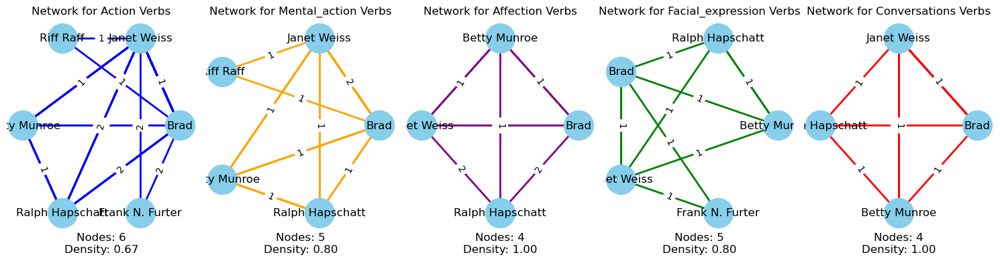

In [37]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/29608974.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [216]:
##32097430.txt

[(['Brad', 'Janet Weiss'], [('sigh', 'conversations'), ('lay', 'action'), ('guess', 'mental_action')]), (['Brad', 'Janet Weiss'], [('go', 'action')])]


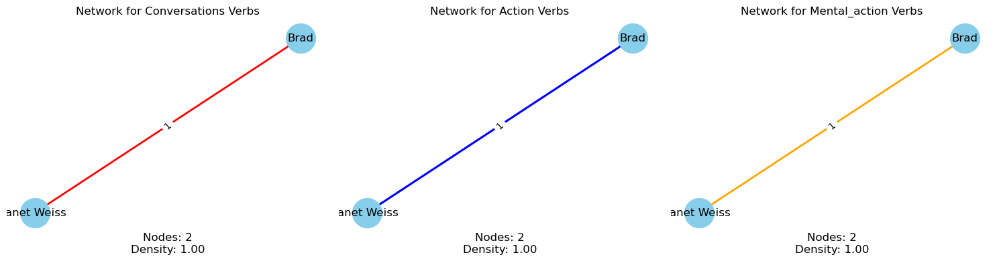

In [38]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/32097430.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [218]:
##32886031.txt

In [220]:
##错误原因：

In [221]:
##34268329.txt

[(['Frank N. Furter', 'Riff Raff'], [('explain', 'conversations'), ('like', 'affection'), ('find', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('push', 'action'), ('thought', 'mental_action')]), (['Magenta', 'Riff Raff'], [('stroke', 'affection'), ('face', 'action'), ('make', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('like', 'affection'), ('spoke', 'action'), ('thought', 'mental_action')]), (['Frank N. Furter', 'Magenta', 'Riff Raff'], [('call', 'conversations'), ('grin', 'facial_expression'), ('kiss', 'affection'), ('push', 'action'), ('thought', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('groan', 'conversations'), ('love', 'affection'), ('act', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('smile', 'facial_expression'), ('like', 'affection'), ('met', 'action'), ('feel', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('like', 'affection'), ('pull', 'action'), ('think', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('groan', 'con

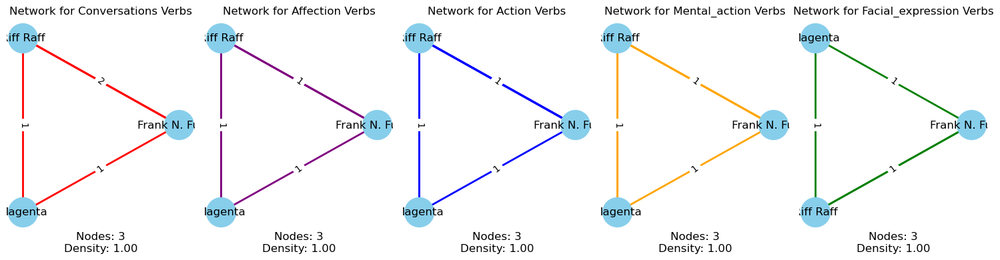

In [40]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/34268329.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [223]:
##34411.txt

[(['Magenta', 'Riff Raff'], [('like', 'affection'), ('walk', 'action')]), (['Columbia', 'Eddie', 'Riff Raff'], [('hang', 'action')]), (['Magenta', 'Riff Raff'], [('ask', 'action'), ('make', 'mental_action')]), (['Magenta', 'Riff Raff'], [('answer', 'conversations')]), (['Columbia', 'Magenta', 'Riff Raff'], [('ask', 'action'), ('miss', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('have', 'action')]), (['Frank N. Furter', 'Magenta'], [('glance', 'facial_expression'), ('glance', 'action')]), (['Columbia', 'Magenta'], [('smile', 'facial_expression'), ('bit', 'action')])]


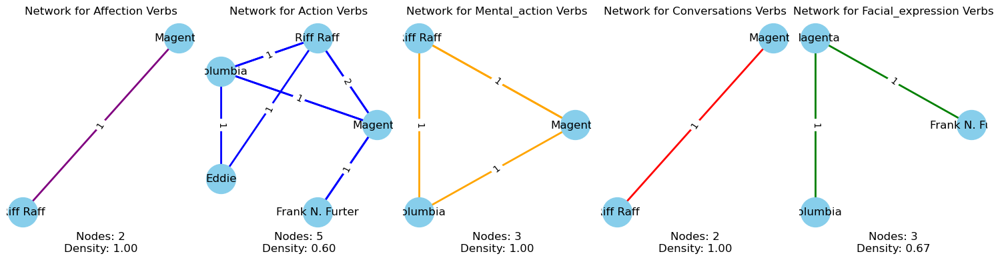

In [41]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/34411.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [225]:
##34495012_txt.txt

[(['Brad', 'Janet Weiss'], [('go', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('like', 'affection')]), (['Janet Weiss', 'Rocky'], [('met', 'action')]), (['Frank N. Furter', 'Rocky'], [('go', 'action')]), (['Frank N. Furter', 'Janet Weiss', 'Rocky'], [('blush', 'facial_expression'), ('face', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('like', 'affection'), ('go', 'action'), ('thought', 'mental_action')]), (['Brad', 'Janet Weiss'], [('lay', 'action')]), (['Brad', 'Janet Weiss'], [('need', 'mental_action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('sit', 'action'), ('thought', 'mental_action')]), (['Brad', 'Janet Weiss'], [('call', 'conversations'), ('drop', 'action'), ('think', 'mental_action')]), (['Brad', 'Janet Weiss'], [('pull', 'action')]), (['Brad', 'Janet Weiss'], [('tell', 'conversations')]), (['Brad', 'Janet Weiss'], [('drive', 'action')]), (['Brad', 'Janet Weiss'], [('kiss', 'affection')]), (['Brad', 'Janet Weiss'], [('kiss', 'affection'), ('have', 'acti

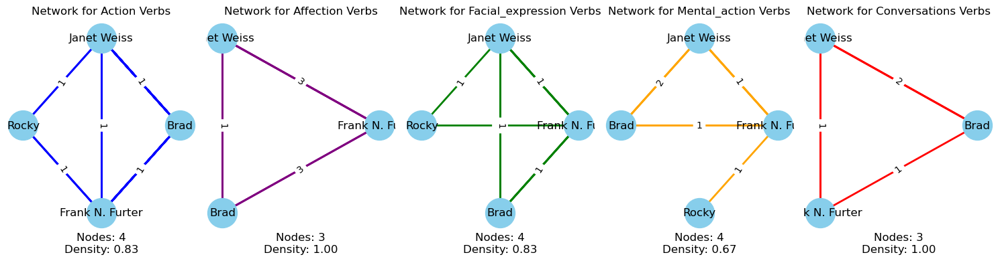

In [42]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/34495012_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [227]:
##34583485.txt

[(['Columbia', 'Eddie'], [('like', 'affection'), ('do', 'action')]), (['Columbia', 'Eddie'], [('kiss', 'affection'), ('save', 'action')]), (['Columbia', 'Eddie'], [('exclaim', 'conversations'), ('laugh', 'facial_expression'), ('like', 'affection'), ('play', 'action')]), (['Eddie', 'Frank N. Furter'], [('love', 'affection'), ('shot', 'action'), ('thought', 'mental_action')]), (['Eddie', 'Frank N. Furter'], [('met', 'action'), ('miss', 'mental_action')]), (['Columbia', 'Eddie'], [('smirk', 'facial_expression'), ('kiss', 'affection'), ('met', 'action'), ('think', 'mental_action')]), (['Columbia', 'Frank N. Furter'], [('cry', 'facial_expression'), ('try', 'action'), ('think', 'mental_action')])]


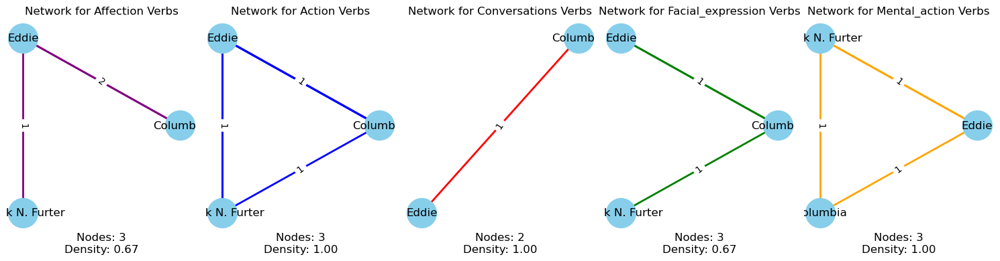

In [43]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/34583485.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [230]:
##35073142.txt

[(['Brad', 'Frank N. Furter'], [('cast', 'action'), ('thought', 'mental_action')]), (['Brad', 'Janet Weiss', 'Rocky'], [('allow', 'action')]), (['Brad', 'Frank N. Furter'], [('sit', 'action')]), (['Brad', 'Rocky'], [('like', 'affection'), ('do', 'action'), ('think', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('comment', 'conversations'), ('glance', 'facial_expression'), ('glance', 'action')]), (['Brad', 'Frank N. Furter'], [('sigh', 'conversations'), ('sleep', 'action'), ('thought', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('answer', 'conversations'), ('lean', 'facial_expression'), ('kiss', 'affection'), ('push', 'action'), ('make', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('say', 'conversations'), ('laugh', 'facial_expression'), ('kiss', 'affection'), ('turn', 'action')]), (['Brad', 'Frank N. Furter'], [('like', 'affection'), ('ask', 'action'), ('think', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('kiss', 'affection'), ('ask', 'action'), ('feel', 'm

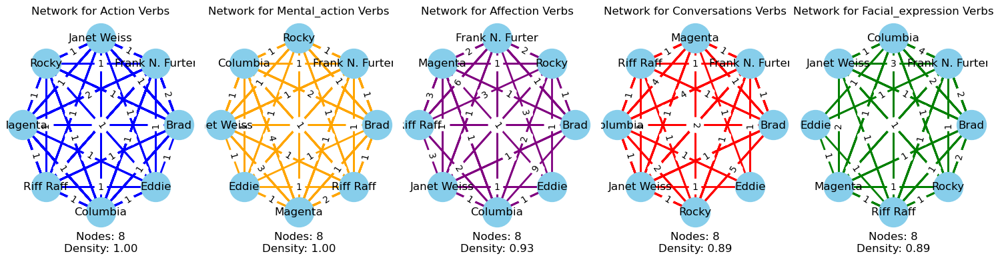

In [44]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/35073142.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [232]:
##35224531.txt

[(['Brad', 'Janet Weiss'], [('do', 'action')]), (['Brad', 'Janet Weiss'], [('sigh', 'conversations'), ('blink', 'facial_expression'), ('hold', 'action'), ('notice', 'mental_action')]), (['Brad', 'Janet Weiss'], [('met', 'action'), ('think', 'mental_action')]), (['Brad', 'Janet Weiss'], [('know', 'action')]), (['Brad', 'Janet Weiss'], [('call', 'conversations'), ('ask', 'action')]), (['Brad', 'Frank N. Furter', 'Magenta'], [('say', 'conversations'), ('grin', 'facial_expression'), ('love', 'affection'), ('ask', 'action'), ('make', 'mental_action')]), (['Columbia', 'Magenta'], [('say', 'conversations'), ('hang', 'action'), ('hate', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('walk', 'action')]), (['Brad', 'Frank N. Furter'], [('do', 'action')]), (['Brad', 'Columbia', 'Magenta'], [('call', 'conversations'), ('care', 'affection'), ('lay', 'action'), ('think', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('call', 'conversations'), ('smile', 'facial_expression'), ('act', 'action

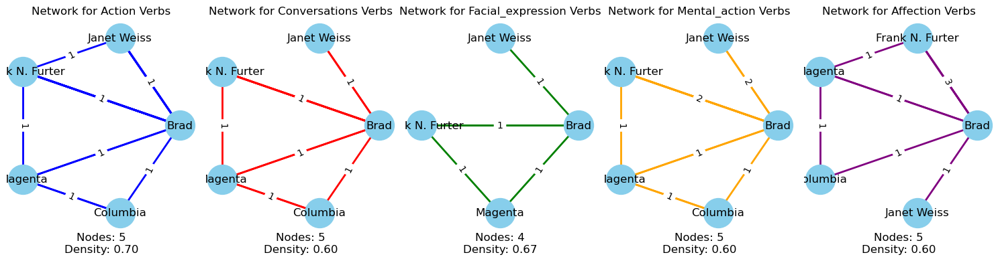

In [45]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/35224531.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [234]:
##35286316.txt（返回原文查看）

In [ ]:
##36512008.txt（返回原文查看）

In [237]:
##36673720.txt

[(['Brad', 'Janet Weiss'], [('like', 'affection')]), (['Frank N. Furter', 'Janet Weiss'], [('take', 'action'), ('miss', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('thank', 'affection'), ('go', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('bear', 'action')]), (['Riff Raff', 'Rocky'], [('plan', 'action'), ('miss', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('giggle', 'facial_expression'), ('talk', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('sigh', 'conversations'), ('kiss', 'affection'), ('plan', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('like', 'affection'), ('go', 'action'), ('thought', 'mental_action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('put', 'action'), ('think', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('force', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('like', 'affection'), ('met', 'action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('care', 'affection'), ('take', 'action')]), 

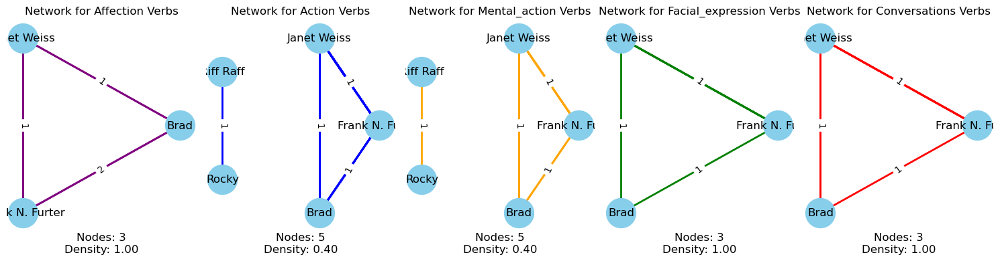

In [48]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/36673720.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [239]:
##37093471.txt

[(['Brad', 'Frank N. Furter', 'Janet Weiss', 'Magenta', 'Riff Raff'], [('write', 'action')]), (['Magenta', 'Riff Raff'], [('get', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('save', 'action')]), (['Frank N. Furter', 'Magenta', 'Riff Raff', 'Rocky'], [('met', 'action')]), (['Magenta', 'Riff Raff'], [('say', 'conversations'), ('have', 'action'), ('hit', 'mental_action')]), (['Columbia', 'Magenta', 'Riff Raff'], [('think', 'mental_action')]), (['Magenta', 'Riff Raff'], [('call', 'conversations'), ('swear', 'action')]), (['Magenta', 'Riff Raff'], [('say', 'conversations'), ('sit', 'action'), ('thought', 'mental_action')]), (['Frank N. Furter', 'Magenta', 'Riff Raff'], [('turn', 'action')]), (['Frank N. Furter', 'Magenta'], [('fight', 'action'), ('consider', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('met', 'action'), ('feel', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('tell', 'conversations'), ('love', 'affection'), ('ask', 'action'), ('think', 'mental_act

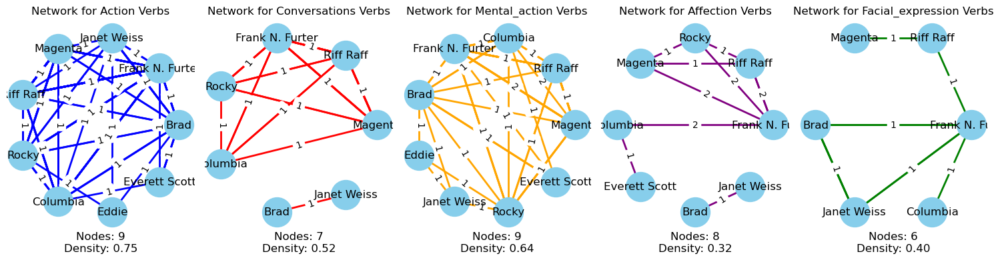

In [49]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/37093471.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [241]:
##37372630.txt

[(['Brad', 'Frank N. Furter'], [('like', 'affection'), ('met', 'action'), ('feel', 'mental_action')]), (['Brad', 'Magenta', 'Rocky'], [('whip', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('sing', 'action')]), (['Brad', 'Riff Raff'], [('smirk', 'facial_expression'), ('put', 'action')]), (['Brad', 'Riff Raff'], [('move', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('yell', 'conversations'), ('stand', 'action')]), (['Brad', 'Frank N. Furter', 'Magenta', 'Riff Raff', 'Rocky'], [('pick', 'action')]), (['Brad', 'Frank N. Furter'], [('met', 'action'), ('worry', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('ask', 'action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('sigh', 'conversations'), ('go', 'action')]), (['Magenta', 'Riff Raff'], [('roll', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('smile', 'facial_expression'), ('ask', 'action'), ('think', 'mental_action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('say', 'conversations'), ('watch', 'facial_ex

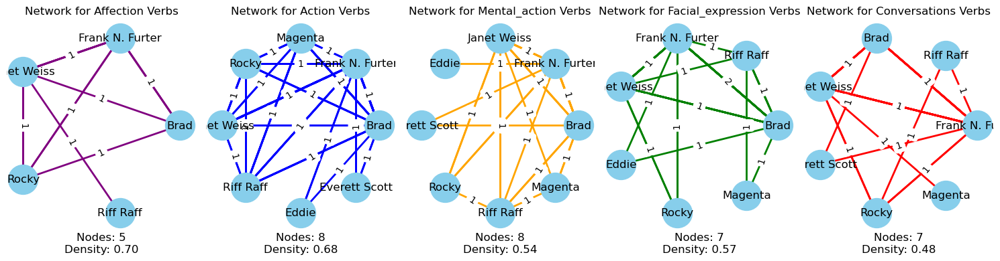

In [50]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/37372630.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [243]:
##37613392.txt

[(['Brad', 'Janet Weiss', 'Rocky'], [('like', 'affection'), ('sing', 'action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('call', 'conversations'), ('like', 'affection'), ('turn', 'action'), ('hit', 'mental_action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss', 'Rocky'], [('talk', 'action')])]


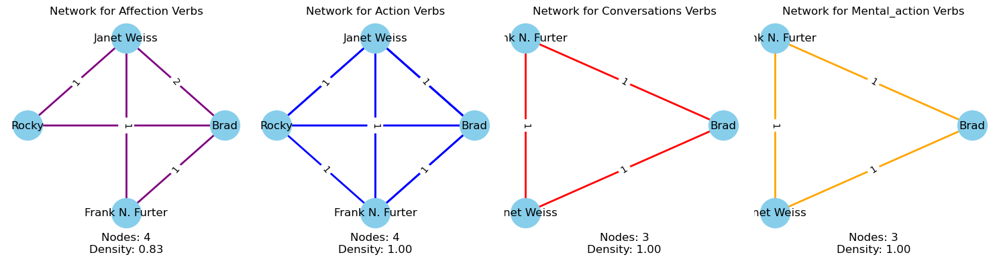

In [51]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/37613392.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [245]:
##37645705_txt.txt

[(['Magenta', 'Riff Raff'], [('take', 'action')]), (['Columbia', 'Eddie', 'Riff Raff'], [('pout', 'facial_expression'), ('like', 'affection'), ('move', 'action'), ('hit', 'mental_action')]), (['Magenta', 'Riff Raff'], [('lean', 'facial_expression'), ('clean', 'action'), ('demand', 'mental_action')])]


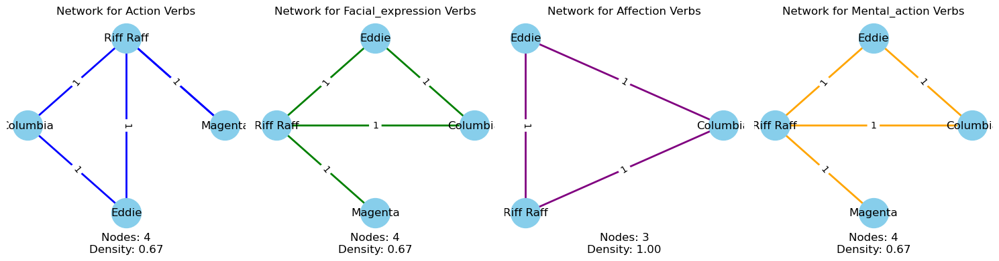

In [52]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/37645705_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [247]:
##37650010.txt

[(['Magenta', 'Riff Raff'], [('guess', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('do', 'action')]), (['Columbia', 'Magenta'], [('roll', 'action')]), (['Columbia', 'Magenta'], [('lean', 'facial_expression'), ('ask', 'action')]), (['Brad', 'Columbia'], [('say', 'conversations'), ('smile', 'facial_expression'), ('turn', 'action')]), (['Brad', 'Janet Weiss', 'Magenta', 'Rocky'], [('whisper', 'conversations'), ('walk', 'action'), ('notice', 'mental_action')]), (['Columbia', 'Magenta'], [('nod', 'action')]), (['Columbia', 'Janet Weiss'], [('watch', 'facial_expression'), ('met', 'action')]), (['Columbia', 'Rocky'], [('laugh', 'facial_expression'), ('face', 'action')]), (['Frank N. Furter', 'Janet Weiss', 'Rocky'], [('mention', 'conversations'), ('like', 'affection'), ('push', 'action'), ('regard', 'mental_action')]), (['Columbia', 'Frank N. Furter'], [('laugh', 'facial_expression'), ('like', 'affection'), ('met', 'action')]), (['Columbia', 'Magenta'], [('put', 'action')]), (['Columb

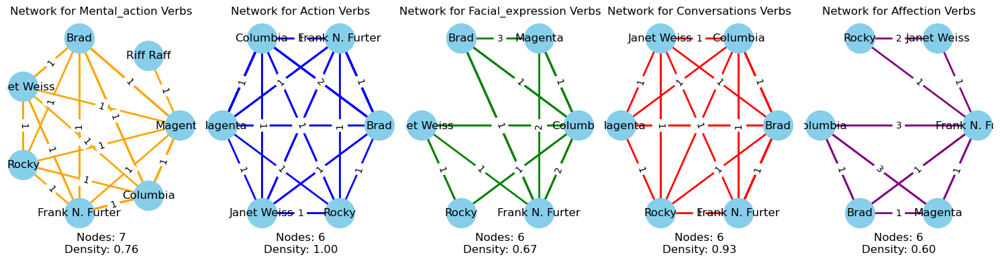

In [53]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/37650010.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [249]:
##38107357.txt

[(['Frank N. Furter', 'Janet Weiss'], [('kiss', 'affection'), ('move', 'action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('say', 'conversations'), ('move', 'action'), ('thought', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('like', 'affection'), ('fell', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('smirk', 'facial_expression'), ('ask', 'action'), ('worry', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('say', 'conversations'), ('stare', 'facial_expression'), ('stroke', 'affection'), ('turn', 'action'), ('think', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('sigh', 'conversations'), ('take', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('groan', 'conversations'), ('care', 'affection'), ('take', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('sigh', 'conversations'), ('giggle', 'facial_expression')]), (['Frank N. Furter', 'Janet Weiss'], [('say', 'conversations'), ('giggle', 'facial_expression'), ('stroke', 'affection'), ('pull

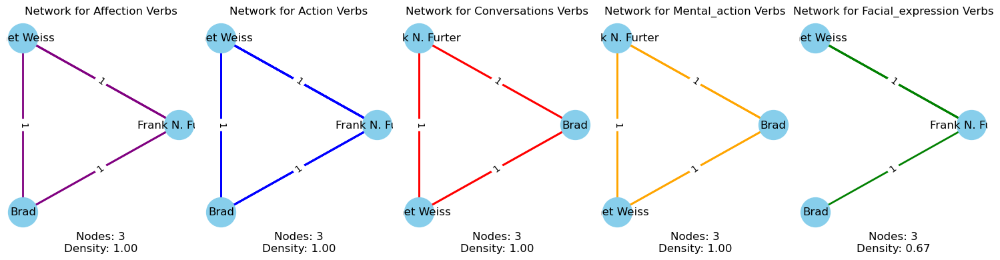

In [54]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/38107357.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [251]:
##38280799.txt

[(['Frank N. Furter', 'Rocky'], [('sleep', 'action'), ('dream', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('move', 'action')]), (['Brad', 'Frank N. Furter'], [('try', 'action'), ('struggle', 'mental_action')]), (['Janet Weiss', 'Magenta', 'Riff Raff'], [('play', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('whimper', 'facial_expression')]), (['Frank N. Furter', 'Janet Weiss'], [('drop', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('watch', 'facial_expression'), ('instruct', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('pull', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('pull', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('scream', 'conversations'), ('thrust', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('smile', 'facial_expression'), ('care', 'affection'), ('control', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('take', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('comment', 'conversations'), ('show', 'action')])]

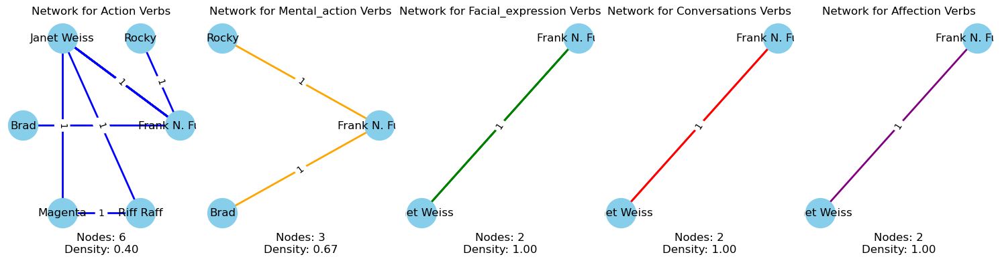

In [55]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/38280799.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [253]:
##38978856.txt

[(['Brad', 'Janet Weiss'], [('try', 'action'), ('thought', 'mental_action')]), (['Brad', 'Columbia', 'Janet Weiss'], [('scream', 'conversations'), ('do', 'action'), ('thought', 'mental_action')]), (['Columbia', 'Magenta', 'Riff Raff'], [('cry', 'facial_expression'), ('hear', 'action')]), (['Frank N. Furter', 'Magenta'], [('care', 'affection'), ('roll', 'action')]), (['Magenta', 'Riff Raff'], [('sigh', 'conversations'), ('care', 'affection'), ('take', 'action')]), (['Magenta', 'Riff Raff'], [('talk', 'action'), ('think', 'mental_action')]), (['Columbia', 'Magenta', 'Riff Raff'], [('like', 'affection'), ('show', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('whisper', 'conversations'), ('like', 'affection'), ('hear', 'action')]), (['Brad', 'Janet Weiss'], [('like', 'affection'), ('turn', 'action')]), (['Brad', 'Janet Weiss'], [('turn', 'action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('face', 'action'), ('think', 'mental_action')]), (['Everett Scott', 'Frank N. Furter'], 

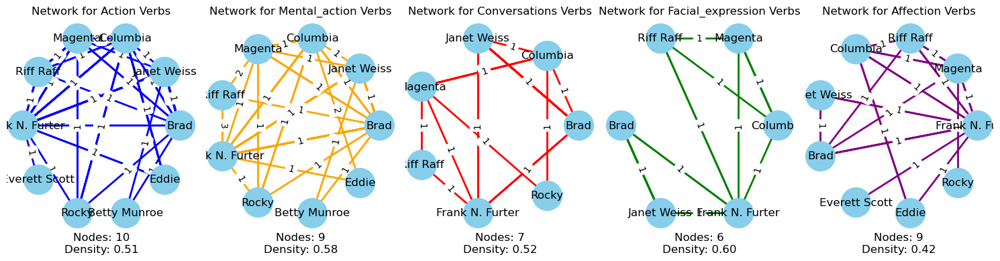

In [56]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/38978856.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [255]:
##39126051.txt

[(['Columbia', 'Frank N. Furter'], [('scream', 'conversations'), ('like', 'affection'), ('find', 'action')]), (['Columbia', 'Magenta'], [('sigh', 'conversations'), ('care', 'affection'), ('do', 'action')]), (['Eddie', 'Frank N. Furter'], [('comment', 'conversations'), ('sing', 'action')])]


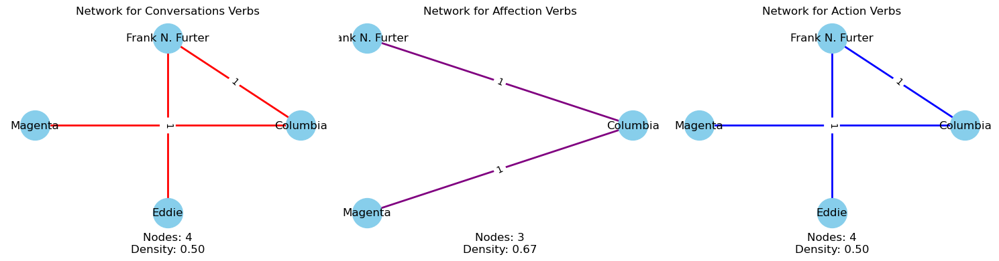

In [57]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/39126051.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [257]:
##39273348.txt

[(['Frank N. Furter', 'Janet Weiss'], [('take', 'action')]), (['Brad', 'Janet Weiss'], [('reply', 'action'), ('think', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('care', 'affection'), ('met', 'action'), ('think', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('sing', 'action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('announce', 'conversations'), ('kiss', 'affection'), ('find', 'action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('call', 'conversations'), ('turn', 'action'), ('think', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('smile', 'facial_expression'), ('face', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('stare', 'facial_expression'), ('push', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('like', 'affection'), ('break', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('take', 'action'), ('think', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('thank', 'affection'), ('turn', 'action')]), (['Brad', 'Ja

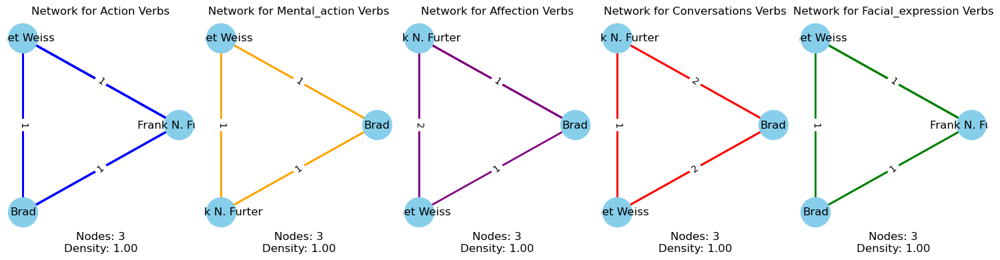

In [58]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/39273348.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [259]:
##39702837.txt

[(['Frank N. Furter', 'Janet Weiss'], [('kiss', 'affection')]), (['Frank N. Furter', 'Janet Weiss'], [('pull', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('smile', 'facial_expression'), ('roll', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('put', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('hold', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('sit', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('like', 'affection'), ('close', 'action'), ('feel', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('care', 'affection'), ('wish', 'mental_action')])]


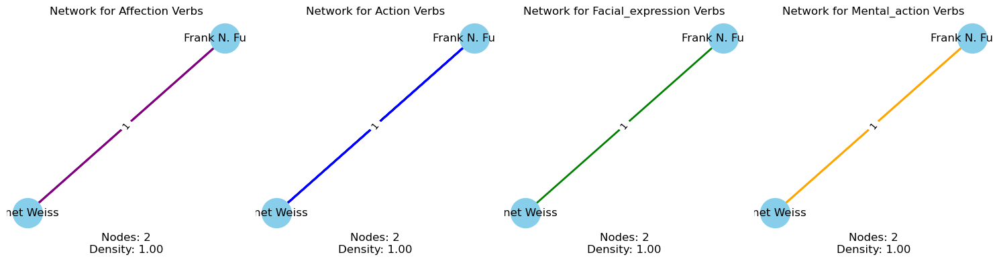

In [59]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/39702837.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [261]:
##39811401.txt

[(['Columbia', 'Frank N. Furter', 'Magenta', 'Rocky'], [('moan', 'facial_expression'), ('act', 'action')]), (['Frank N. Furter', 'Rocky'], [('pull', 'action')]), (['Frank N. Furter', 'Rocky'], [('act', 'action')]), (['Janet Weiss', 'Magenta', 'Riff Raff'], [('act', 'action'), ('suspect', 'mental_action')]), (['Frank N. Furter', 'Magenta', 'Rocky'], [('announce', 'conversations'), ('decide', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('care', 'affection'), ('ask', 'action')]), (['Brad', 'Eddie', 'Janet Weiss'], [('cast', 'action')]), (['Columbia', 'Magenta'], [('do', 'action'), ('feel', 'mental_action')]), (['Columbia', 'Frank N. Furter', 'Rocky'], [('kill', 'action')]), (['Columbia', 'Magenta'], [('call', 'conversations'), ('love', 'affection')]), (['Columbia', 'Frank N. Furter', 'Magenta'], [('say', 'conversations'), ('ask', 'action')]), (['Columbia', 'Magenta'], [('find', 'action')]), (['Brad', 'Janet Weiss', 'Riff Raff'], [('win', 'action')]), (['Brad', 'Janet Weiss'], [(

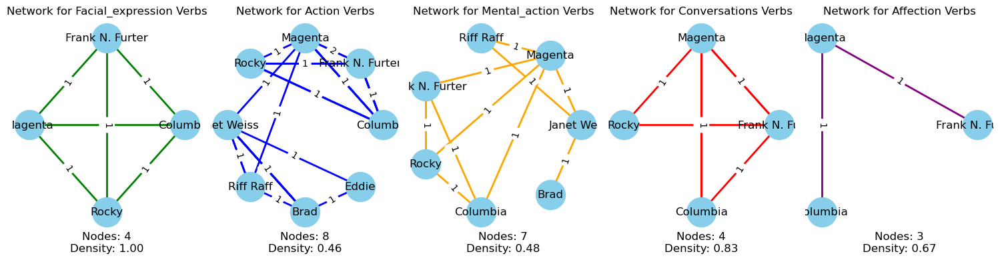

In [60]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/39811401.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [263]:
##40258689.txt

[(['Frank N. Furter', 'Janet Weiss'], [('hold', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('sigh', 'conversations'), ('win', 'action'), ('wonder', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('take', 'action')])]


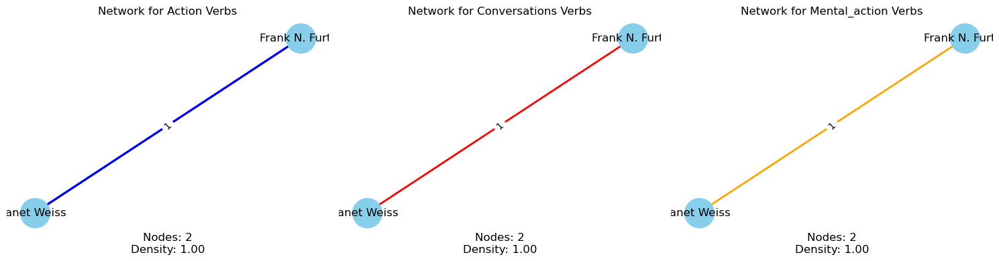

In [61]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/40258689.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [265]:
##40481862.txt

[(['Columbia', 'Magenta'], [('care', 'affection'), ('gasp', 'action'), ('feel', 'mental_action')]), (['Columbia', 'Magenta'], [('like', 'affection'), ('turn', 'action')]), (['Columbia', 'Magenta'], [('tease', 'facial_expression'), ('bring', 'action')]), (['Columbia', 'Magenta'], [('moan', 'facial_expression'), ('kiss', 'affection'), ('pull', 'action')]), (['Columbia', 'Magenta'], [('burst', 'action'), ('need', 'mental_action')]), (['Columbia', 'Magenta'], [('care', 'affection'), ('take', 'action')]), (['Columbia', 'Magenta'], [('sigh', 'conversations'), ('take', 'action')]), (['Columbia', 'Magenta'], [('call', 'conversations'), ('watch', 'facial_expression'), ('care', 'affection'), ('turn', 'action'), ('thought', 'mental_action')]), (['Columbia', 'Magenta'], [('call', 'conversations')])]


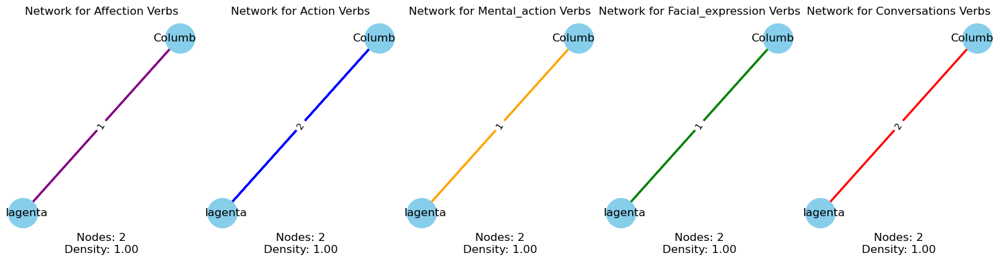

In [62]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/40481862.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [267]:
##4092298.txt

[(['Janet Weiss', 'Riff Raff'], [('take', 'action'), ('comfort', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('come', 'action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('say', 'conversations'), ('sit', 'action')]), (['Brad', 'Frank N. Furter'], [('plan', 'action'), ('think', 'mental_action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('glance', 'facial_expression'), ('glance', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('bit', 'action'), ('decide', 'mental_action')]), (['Brad', 'Frank N. Furter', 'Riff Raff'], [('move', 'action'), ('think', 'mental_action')]), (['Brad', 'Frank N. Furter', 'Magenta'], [('like', 'affection'), ('jolt', 'action')]), (['Brad', 'Frank N. Furter', 'Magenta'], [('drop', 'action'), ('hit', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('groan', 'conversations'), ('find', 'action')]), (['Brad', 'Janet Weiss'], [('glance', 'facial_expression'), ('glance', 'action')]), (['Brad', 'Janet Weiss', 'Riff Raff'], [('regard', 

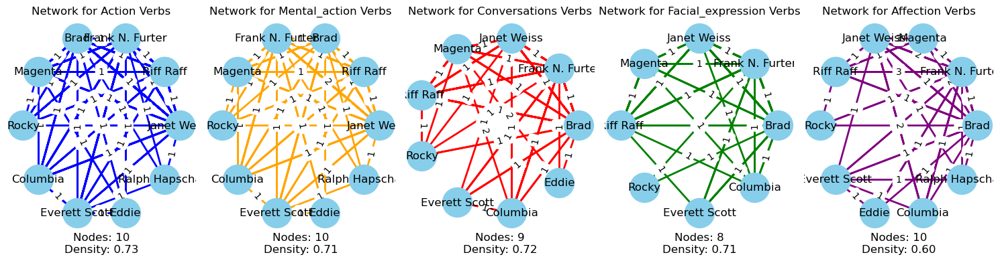

In [63]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/4092298.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [269]:
##41571429.txt

[(['Columbia', 'Frank N. Furter', 'Janet Weiss', 'Rocky'], [('cast', 'action')]), (['Brad', 'Janet Weiss'], [('face', 'action')]), (['Brad', 'Janet Weiss'], [('walk', 'action'), ('think', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('bring', 'action'), ('thought', 'mental_action')]), (['Brad', 'Janet Weiss'], [('talk', 'action'), ('thought', 'mental_action')]), (['Brad', 'Janet Weiss'], [('tell', 'conversations'), ('nod', 'action')]), (['Brad', 'Janet Weiss'], [('touch', 'action')]), (['Brad', 'Frank N. Furter'], [('put', 'action'), ('thought', 'mental_action')]), (['Brad', 'Janet Weiss'], [('ask', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('pull', 'action'), ('consider', 'mental_action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('say', 'conversations'), ('met', 'action')]), (['Brad', 'Rocky'], [('act', 'action'), ('thought', 'mental_action')]), (['Brad', 'Janet Weiss'], [('say', 'conversations'), ('smile', 'facial_expression'), ('love', 'affection'), ('sing', '

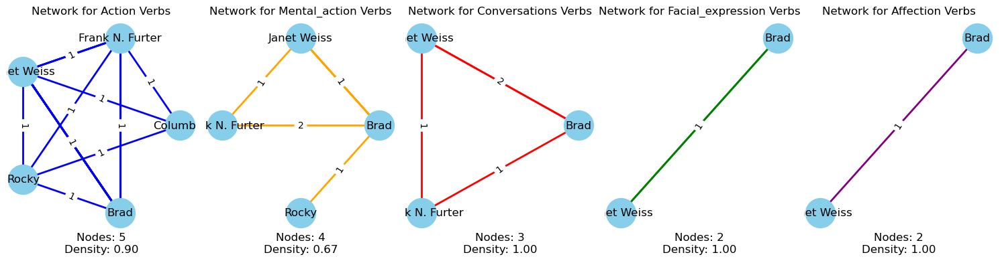

In [64]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/41571429.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [271]:
##41587494.txt

[(['Columbia', 'Janet Weiss'], [('call', 'conversations'), ('love', 'affection'), ('find', 'action'), ('consider', 'mental_action')]), (['Brad', 'Everett Scott'], [('watch', 'facial_expression'), ('like', 'affection'), ('breathe', 'action')]), (['Magenta', 'Riff Raff', 'Rocky'], [('like', 'affection'), ('sing', 'action')]), (['Frank N. Furter', 'Rocky'], [('smile', 'facial_expression'), ('pull', 'action')]), (['Frank N. Furter', 'Magenta'], [('love', 'affection'), ('trust', 'action')]), (['Magenta', 'Riff Raff'], [('thank', 'affection'), ('sit', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('sing', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('face', 'action'), ('feel', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('call', 'conversations'), ('met', 'action'), ('need', 'mental_action')]), (['Brad', 'Janet Weiss'], [('say', 'conversations'), ('ask', 'action')]), (['Everett Scott', 'Frank N. Furter'], [('say', 'conversations'), ('smile', 'facial_expression'), ('t

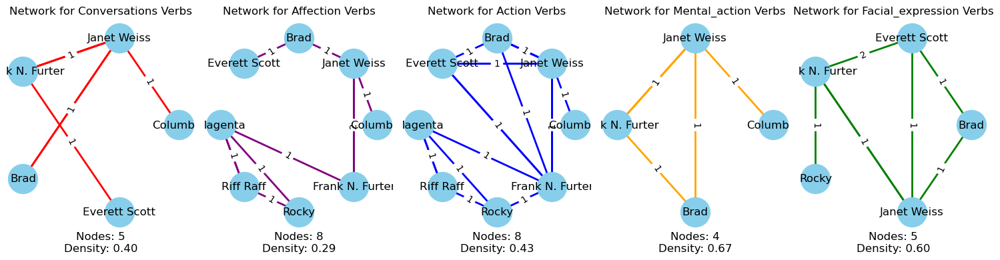

In [65]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/41587494.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [273]:
##42486444_txt.txt

[(['Frank N. Furter', 'Magenta', 'Riff Raff'], [('plan', 'action')]), (['Magenta', 'Riff Raff'], [('sigh', 'conversations'), ('turn', 'action'), ('think', 'mental_action')]), (['Magenta', 'Riff Raff'], [('like', 'affection'), ('try', 'action')]), (['Magenta', 'Riff Raff'], [('ask', 'action'), ('wonder', 'mental_action')]), (['Columbia', 'Frank N. Furter'], [('stand', 'action')]), (['Columbia', 'Riff Raff'], [('say', 'conversations'), ('sit', 'action'), ('hate', 'mental_action')]), (['Magenta', 'Riff Raff'], [('cast', 'action')]), (['Magenta', 'Riff Raff'], [('say', 'conversations'), ('love', 'affection'), ('sit', 'action'), ('need', 'mental_action')]), (['Magenta', 'Riff Raff'], [('smirk', 'facial_expression'), ('try', 'action'), ('make', 'mental_action')])]


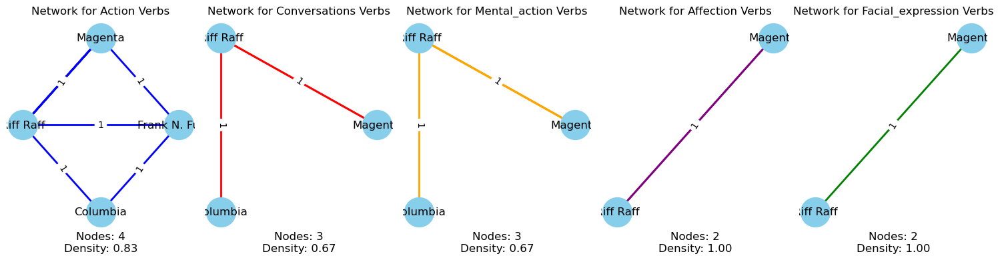

In [66]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/42486444_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [275]:
##42717156_txt.txt

[(['Magenta', 'Riff Raff'], [('do', 'action')]), (['Columbia', 'Eddie'], [('love', 'affection'), ('fall', 'action')]), (['Brad', 'Janet Weiss'], [('ask', 'action')])]


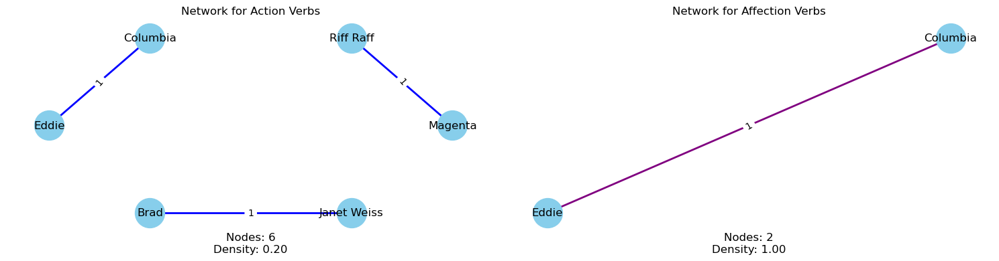

In [67]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/42717156_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [277]:
##42737817_txt.txt

[(['Columbia', 'Magenta'], [('say', 'conversations'), ('like', 'affection'), ('fuck', 'action')]), (['Columbia', 'Eddie', 'Magenta'], [('love', 'affection'), ('try', 'action'), ('consider', 'mental_action')]), (['Columbia', 'Eddie', 'Magenta'], [('like', 'affection'), ('use', 'action')]), (['Columbia', 'Janet Weiss'], [('met', 'action'), ('hate', 'mental_action')]), (['Columbia', 'Eddie', 'Janet Weiss', 'Magenta', 'Rocky'], [('watch', 'facial_expression'), ('fuck', 'action'), ('think', 'mental_action')]), (['Columbia', 'Magenta'], [('turn', 'action')]), (['Columbia', 'Magenta'], [('grin', 'facial_expression'), ('turn', 'action'), ('think', 'mental_action')])]


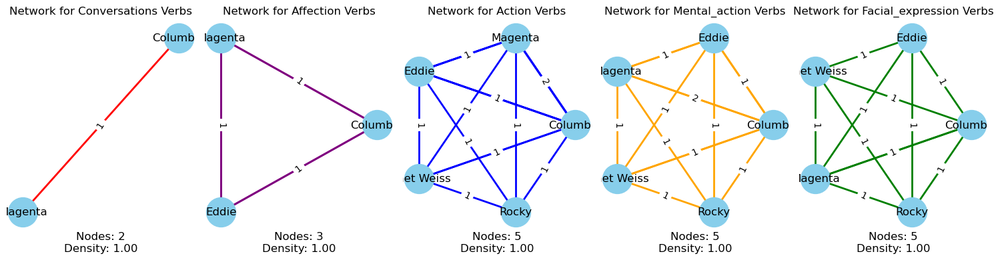

In [68]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/42737817_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [279]:
##43430671_txt.txt

[(['Frank N. Furter', 'Riff Raff'], [('say', 'conversations'), ('take', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('blink', 'facial_expression'), ('care', 'affection'), ('walk', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('stare', 'facial_expression'), ('walk', 'action')]), (['Frank N. Furter', 'Magenta', 'Riff Raff'], [('knock', 'action'), ('hit', 'mental_action')]), (['Frank N. Furter', 'Magenta', 'Riff Raff'], [('glance', 'facial_expression'), ('stroke', 'affection'), ('glance', 'action'), ('think', 'mental_action')]), (['Magenta', 'Riff Raff'], [('laugh', 'facial_expression'), ('ask', 'action')]), (['Columbia', 'Riff Raff'], [('smile', 'facial_expression'), ('love', 'affection'), ('walk', 'action')]), (['Magenta', 'Riff Raff'], [('stay', 'action')]), (['Magenta', 'Riff Raff'], [('cry', 'facial_expression'), ('walk', 'action')]), (['Magenta', 'Riff Raff'], [('like', 'affection'), ('take', 'action')]), (['Columbia', 'Riff Raff'], [('make', 'action'), ('make', 'mental_act

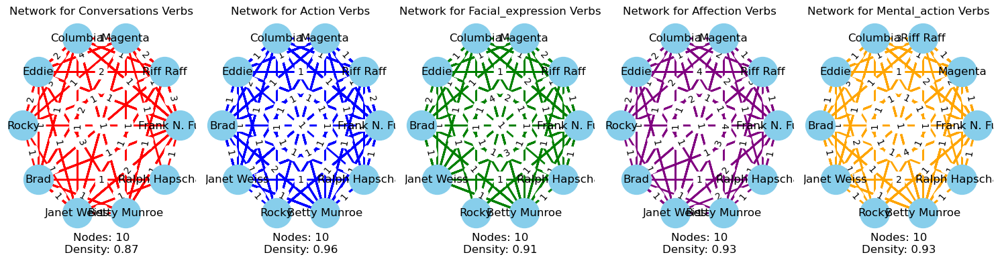

In [69]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/43430671_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [281]:
##44492005_txt.txt

[(['Frank N. Furter', 'Magenta'], [('grab', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('command', 'action')]), (['Frank N. Furter', 'Magenta'], [('roll', 'action'), ('thought', 'mental_action')]), (['Columbia', 'Frank N. Furter'], [('cast', 'action')]), (['Magenta', 'Riff Raff'], [('smirk', 'facial_expression'), ('turn', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('spoke', 'action')]), (['Columbia', 'Riff Raff'], [('pull', 'action')]), (['Columbia', 'Frank N. Furter', 'Magenta'], [('turn', 'action')]), (['Magenta', 'Riff Raff'], [('glance', 'facial_expression'), ('glance', 'action')]), (['Magenta', 'Riff Raff'], [('laugh', 'facial_expression'), ('sit', 'action')])]


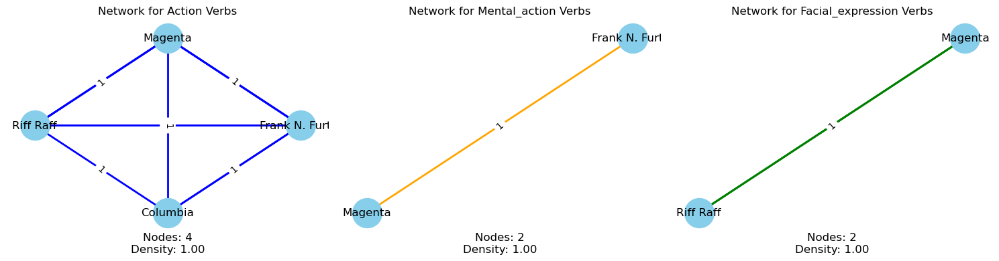

In [70]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/44492005_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [283]:
##44501146_txt.txt

[(['Frank N. Furter', 'Janet Weiss'], [('come', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('whisper', 'conversations'), ('ask', 'action'), ('feel', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('sigh', 'conversations'), ('take', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('keep', 'action'), ('need', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('kiss', 'affection'), ('face', 'action'), ('make', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('bit', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('murmur', 'conversations'), ('keep', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('whisper', 'conversations'), ('like', 'affection'), ('saw', 'action'), ('feel', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('moan', 'facial_expression'), ('like', 'affection'), ('ask', 'action'), ('need', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('ask', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('moan', 'facia

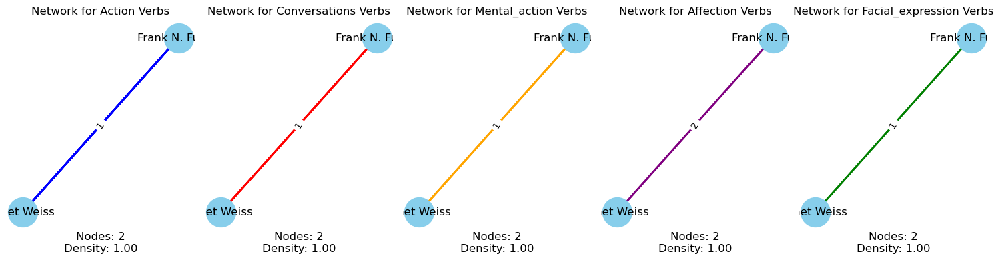

In [71]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/44501146_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [285]:
##46470013_txt.txt

[(['Frank N. Furter', 'Riff Raff'], [('sigh', 'conversations'), ('watch', 'facial_expression'), ('ask', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('groan', 'conversations'), ('like', 'affection'), ('sit', 'action'), ('need', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('smirk', 'facial_expression')]), (['Frank N. Furter', 'Riff Raff'], [('say', 'conversations'), ('smirk', 'facial_expression'), ('kiss', 'affection'), ('pull', 'action'), ('make', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('face', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('answer', 'conversations'), ('watch', 'facial_expression'), ('turn', 'action'), ('thought', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('watch', 'facial_expression'), ('fuck', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('like', 'affection'), ('shake', 'action'), ('thought', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('groan', 'conversations'), ('watch', 'facial_expression'), ('pull'

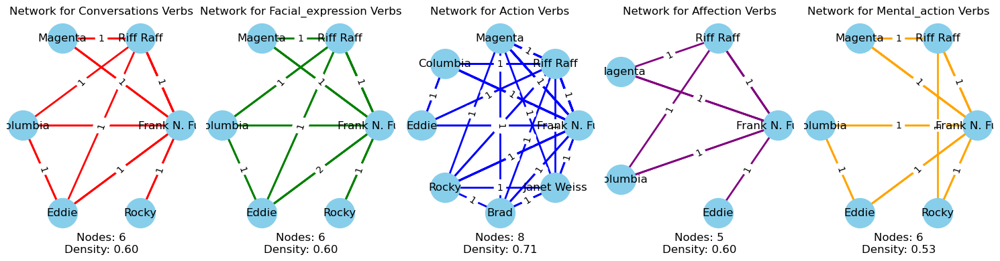

In [72]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/46470013_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [287]:
##46787956_txt.txt

[(['Frank N. Furter', 'Janet Weiss'], [('sigh', 'conversations'), ('move', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('call', 'conversations'), ('saw', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('move', 'action'), ('need', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('say', 'conversations'), ('like', 'affection'), ('try', 'action')]), (['Brad', 'Frank N. Furter'], [('growl', 'conversations'), ('like', 'affection'), ('take', 'action'), ('thought', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('say', 'conversations'), ('laugh', 'facial_expression'), ('like', 'affection'), ('hold', 'action'), ('feel', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('smirk', 'facial_expression')]), (['Brad', 'Frank N. Furter'], [('chuckle', 'facial_expression'), ('drop', 'action')])]


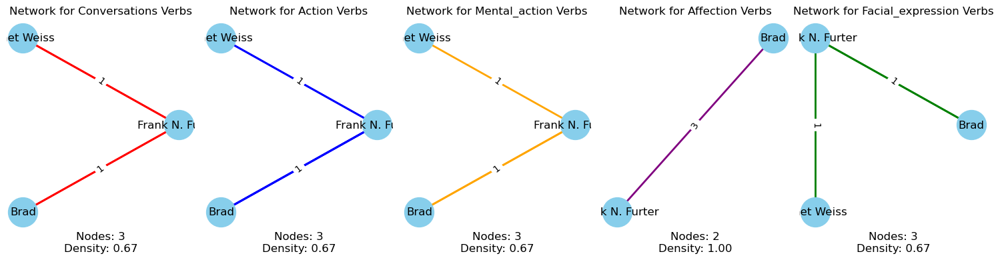

In [73]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/46787956_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [289]:
##47993905_txt.txt

[(['Frank N. Furter', 'Magenta', 'Riff Raff', 'Rocky'], [('try', 'action')]), (['Columbia', 'Eddie', 'Frank N. Furter', 'Magenta', 'Riff Raff'], [('yell', 'conversations'), ('mutter', 'facial_expression'), ('love', 'affection'), ('take', 'action'), ('make', 'mental_action')]), (['Eddie', 'Frank N. Furter', 'Magenta', 'Rocky'], [('watch', 'facial_expression'), ('take', 'action'), ('think', 'mental_action')]), (['Frank N. Furter', 'Magenta', 'Riff Raff'], [('sigh', 'conversations'), ('smile', 'facial_expression'), ('love', 'affection'), ('ask', 'action'), ('think', 'mental_action')]), (['Frank N. Furter', 'Magenta', 'Riff Raff'], [('smile', 'facial_expression'), ('care', 'affection'), ('turn', 'action')]), (['Frank N. Furter', 'Magenta', 'Riff Raff'], [('call', 'conversations'), ('smile', 'facial_expression'), ('kiss', 'affection'), ('spoke', 'action'), ('hit', 'mental_action')]), (['Magenta', 'Riff Raff'], [('grin', 'facial_expression'), ('love', 'affection'), ('hold', 'action'), ('wond

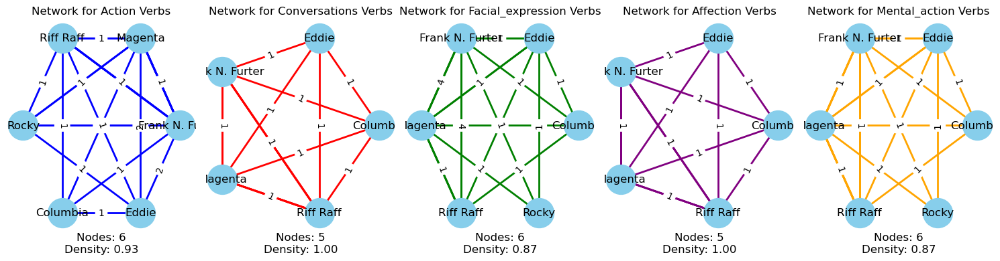

In [74]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/47993905_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [291]:
##49048579_txt.txt

[(['Columbia', 'Eddie'], [('bring', 'action')]), (['Columbia', 'Eddie', 'Frank N. Furter'], [('like', 'affection'), ('have', 'action')]), (['Columbia', 'Eddie'], [('say', 'conversations'), ('grin', 'facial_expression'), ('kiss', 'affection'), ('use', 'action'), ('think', 'mental_action')]), (['Columbia', 'Eddie', 'Frank N. Furter'], [('watch', 'facial_expression'), ('care', 'affection'), ('fuck', 'action')]), (['Columbia', 'Eddie'], [('go', 'action')]), (['Columbia', 'Magenta'], [('do', 'action')]), (['Columbia', 'Eddie', 'Magenta'], [('go', 'action')]), (['Columbia', 'Eddie'], [('kiss', 'affection'), ('find', 'action')]), (['Columbia', 'Frank N. Furter'], [('call', 'conversations')]), (['Eddie', 'Frank N. Furter'], [('hold', 'action'), ('feel', 'mental_action')]), (['Eddie', 'Frank N. Furter'], [('check', 'action')]), (['Eddie', 'Frank N. Furter'], [('say', 'conversations'), ('check', 'action')]), (['Eddie', 'Frank N. Furter'], [('lean', 'facial_expression'), ('kiss', 'affection')]), 

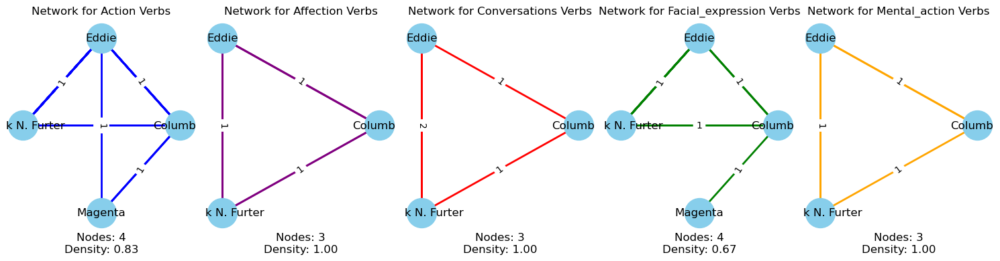

In [75]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/49048579_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [293]:
##49190599_txt.txt

[(['Columbia', 'Magenta'], [('take', 'action')]), (['Frank N. Furter', 'Magenta'], [('love', 'affection'), ('hold', 'action'), ('make', 'mental_action')]), (['Columbia', 'Magenta'], [('like', 'affection'), ('met', 'action'), ('thought', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('love', 'affection'), ('hurt', 'action')]), (['Columbia', 'Magenta', 'Riff Raff'], [('like', 'affection'), ('act', 'action'), ('hit', 'mental_action')]), (['Columbia', 'Magenta'], [('close', 'action')]), (['Columbia', 'Magenta', 'Riff Raff'], [('face', 'action')]), (['Frank N. Furter', 'Magenta', 'Riff Raff'], [('tell', 'conversations'), ('like', 'affection'), ('spoke', 'action')]), (['Magenta', 'Riff Raff'], [('care', 'affection'), ('ask', 'action')]), (['Frank N. Furter', 'Magenta'], [('smile', 'facial_expression'), ('talk', 'action'), ('need', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('go', 'action')]), (['Frank N. Furter', 'Magenta'], [('glare', 'facial_expression'), ('sing', 'actio

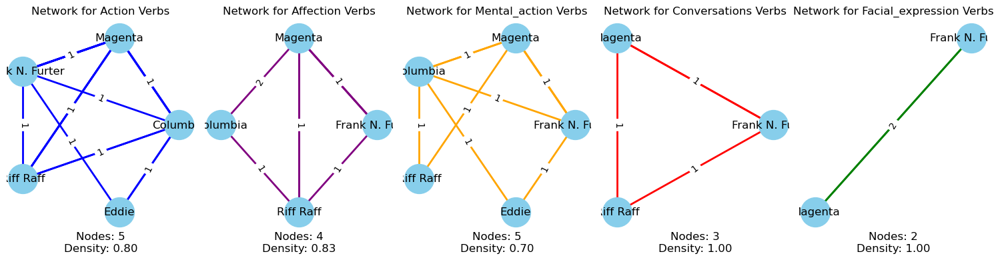

In [76]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/49190599_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [295]:
##49230934_txt.txt

[(['Brad', 'Frank N. Furter'], [('put', 'action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss', 'Magenta', 'Riff Raff', 'Rocky'], [('take', 'action')]), (['Brad', 'Janet Weiss'], [('find', 'action')]), (['Frank N. Furter', 'Rocky'], [('take', 'action'), ('thought', 'mental_action')]), (['Brad', 'Janet Weiss'], [('sing', 'action')]), (['Eddie', 'Frank N. Furter'], [('kill', 'action')]), (['Brad', 'Frank N. Furter'], [('stand', 'action'), ('upset', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('work', 'action')]), (['Brad', 'Frank N. Furter'], [('glance', 'facial_expression'), ('glance', 'action'), ('comfort', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('go', 'action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('plan', 'action')]), (['Brad', 'Frank N. Furter'], [('keep', 'action')]), (['Brad', 'Frank N. Furter'], [('take', 'action')]), (['Brad', 'Frank N. Furter'], [('cover', 'action')]), (['Brad', 'Frank N. Furter'], [('act', 'action')]), (['Brad', 'Frank N. Furter

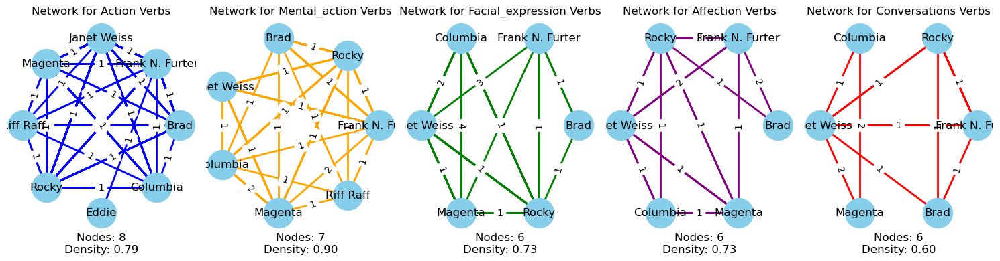

In [77]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/49230934_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [297]:
##49454569_txt.txt

[(['Brad', 'Frank N. Furter'], [('pull', 'action'), ('decide', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('care', 'affection')]), (['Brad', 'Frank N. Furter'], [('love', 'affection'), ('swear', 'action'), ('need', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('love', 'affection'), ('raise', 'action'), ('make', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('moan', 'facial_expression'), ('show', 'action'), ('make', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('murmur', 'conversations'), ('smile', 'facial_expression'), ('kiss', 'affection'), ('spoke', 'action')]), (['Brad', 'Frank N. Furter'], [('push', 'action'), ('struggle', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('kiss', 'affection'), ('move', 'action'), ('feel', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('spoke', 'action')]), (['Brad', 'Frank N. Furter'], [('tell', 'conversations'), ('moan', 'facial_expression'), ('sped', 'action'), ('feel', 'mental_action')]), (['Brad', 'Frank N. Furte

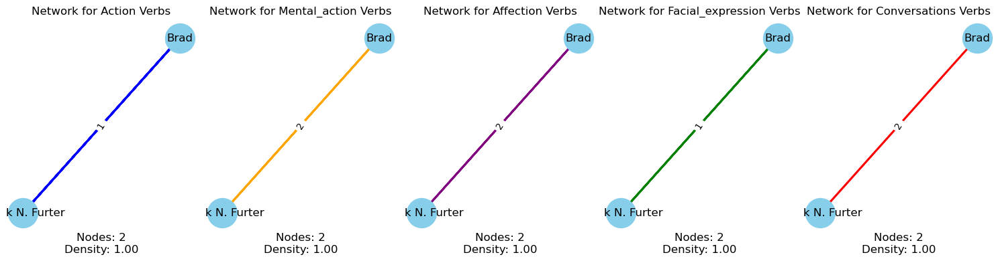

In [78]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/49454569_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [299]:
##49753975_txt.txt

[(['Brad', 'Janet Weiss'], [('love', 'affection'), ('know', 'action'), ('feel', 'mental_action')]), (['Columbia', 'Riff Raff'], [('ask', 'action')]), (['Eddie', 'Janet Weiss'], [('met', 'action'), ('remember', 'mental_action')]), (['Columbia', 'Janet Weiss'], [('call', 'conversations'), ('laugh', 'facial_expression'), ('met', 'action')]), (['Columbia', 'Janet Weiss'], [('sing', 'action'), ('feel', 'mental_action')]), (['Columbia', 'Eddie', 'Frank N. Furter', 'Janet Weiss'], [('say', 'conversations'), ('tease', 'facial_expression'), ('love', 'affection'), ('cast', 'action'), ('believe', 'mental_action')]), (['Janet Weiss', 'Magenta'], [('laugh', 'facial_expression'), ('thought', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('love', 'affection'), ('know', 'action')]), (['Columbia', 'Janet Weiss', 'Magenta'], [('laugh', 'facial_expression'), ('have', 'action')]), (['Columbia', 'Janet Weiss', 'Magenta'], [('explain', 'conversations'), ('sleep', 'action')]), (['Columbia', 'Jane

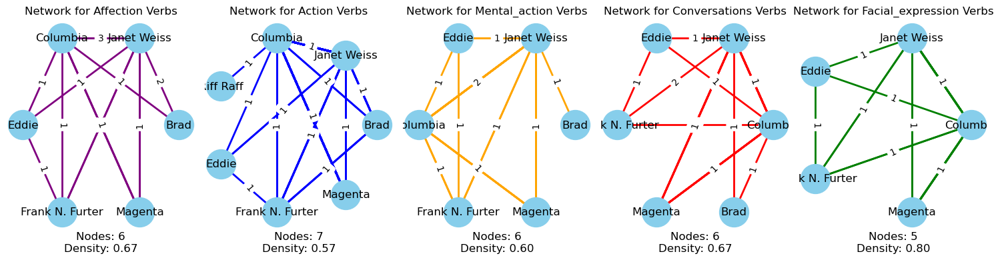

In [79]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/49753975_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [301]:
##49808935_txt.txt

[(['Columbia', 'Eddie'], [('smile', 'facial_expression'), ('take', 'action')]), (['Columbia', 'Eddie'], [('care', 'affection'), ('act', 'action'), ('feel', 'mental_action')]), (['Columbia', 'Eddie'], [('care', 'affection')]), (['Columbia', 'Eddie'], [('pass', 'action')]), (['Columbia', 'Eddie'], [('sigh', 'conversations'), ('show', 'action'), ('decide', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('comment', 'conversations'), ('scoff', 'facial_expression'), ('hold', 'action'), ('wonder', 'mental_action')]), (['Columbia', 'Eddie'], [('sit', 'action')]), (['Columbia', 'Eddie'], [('move', 'action')]), (['Columbia', 'Eddie'], [('smirk', 'facial_expression'), ('spoke', 'action')]), (['Eddie', 'Frank N. Furter'], [('put', 'action')]), (['Columbia', 'Frank N. Furter'], [('win', 'action'), ('notice', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('whisper', 'conversations'), ('like', 'affection'), ('turn', 'action'), ('feel', 'mental_action')])]


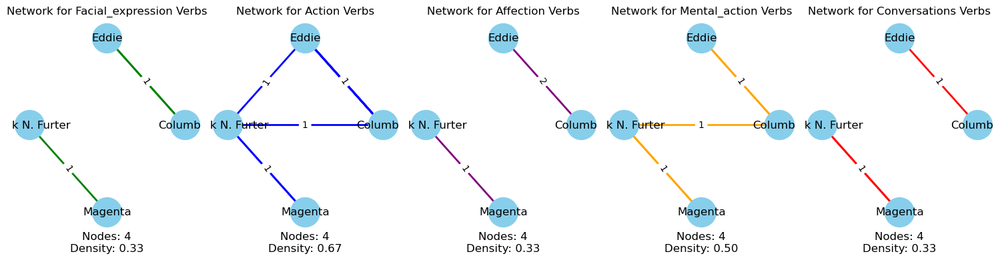

In [80]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/49808935_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [303]:
##50729368_txt.txt

[(['Columbia', 'Eddie'], [('like', 'affection'), ('fuck', 'action')]), (['Columbia', 'Eddie'], [('mention', 'conversations'), ('like', 'affection'), ('force', 'action'), ('remember', 'mental_action')])]


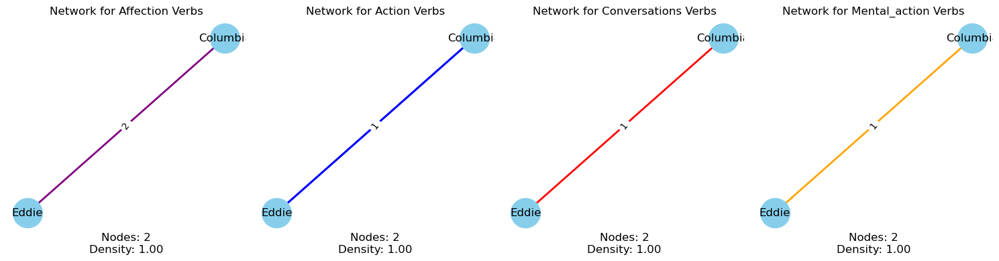

In [81]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/50729368_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [305]:
##50886793_txt.txt

[(['Eddie', 'Frank N. Furter', 'Riff Raff', 'Rocky'], [('say', 'conversations'), ('like', 'affection'), ('ask', 'action'), ('make', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('love', 'affection'), ('kill', 'action')]), (['Brad', 'Janet Weiss'], [('cast', 'action')]), (['Columbia', 'Janet Weiss'], [('ask', 'action'), ('notice', 'mental_action')]), (['Brad', 'Eddie', 'Janet Weiss'], [('love', 'affection'), ('ask', 'action'), ('thought', 'mental_action')])]


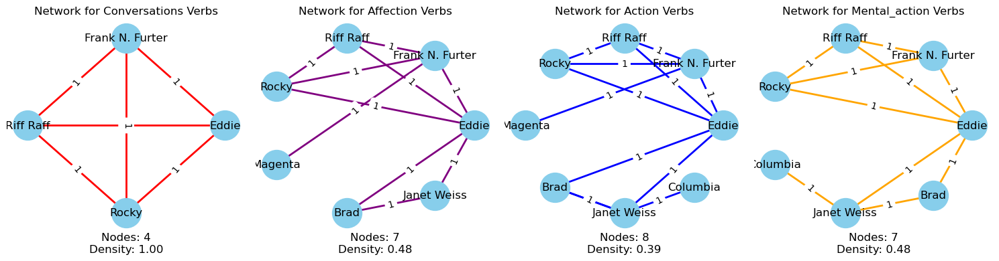

In [82]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/50886793_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [307]:
##51255037_txt.txt

[(['Columbia', 'Eddie', 'Magenta'], [('face', 'action'), ('feel', 'mental_action')]), (['Columbia', 'Magenta'], [('watch', 'facial_expression'), ('hold', 'action'), ('feel', 'mental_action')]), (['Columbia', 'Eddie'], [('love', 'affection'), ('hear', 'action'), ('decide', 'mental_action')]), (['Columbia', 'Riff Raff'], [('have', 'action'), ('wish', 'mental_action')]), (['Columbia', 'Riff Raff'], [('whimper', 'facial_expression'), ('kiss', 'affection'), ('find', 'action'), ('wish', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('smoke', 'action'), ('demand', 'mental_action')]), (['Columbia', 'Riff Raff'], [('mention', 'conversations'), ('love', 'affection'), ('fall', 'action'), ('hit', 'mental_action')]), (['Frank N. Furter', 'Magenta', 'Riff Raff'], [('smirk', 'facial_expression'), ('beat', 'action')]), (['Magenta', 'Riff Raff'], [('laugh', 'facial_expression')])]


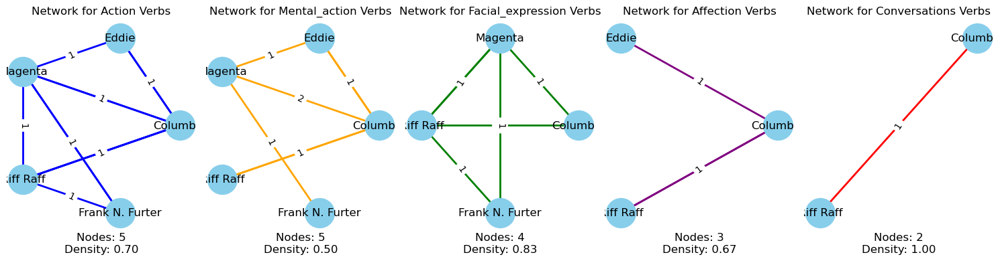

In [83]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/51255037_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [309]:
##51274501_txt.txt

[(['Frank N. Furter', 'Janet Weiss'], [('say', 'conversations'), ('talk', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('like', 'affection'), ('hurt', 'action'), ('dream', 'mental_action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('do', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('care', 'affection')]), (['Brad', 'Janet Weiss'], [('exclaim', 'conversations'), ('stare', 'facial_expression'), ('nod', 'action')]), (['Brad', 'Janet Weiss'], [('like', 'affection'), ('roll', 'action'), ('wonder', 'mental_action')])]


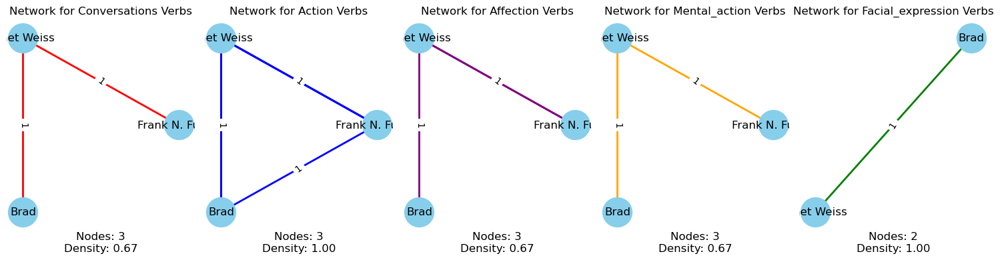

In [84]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/51274501_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [311]:
##51817627_txt.txt（检查原文）

In [313]:
##51831301_txt.txt

[(['Frank N. Furter', 'Magenta'], [('smile', 'facial_expression'), ('sing', 'action')])]


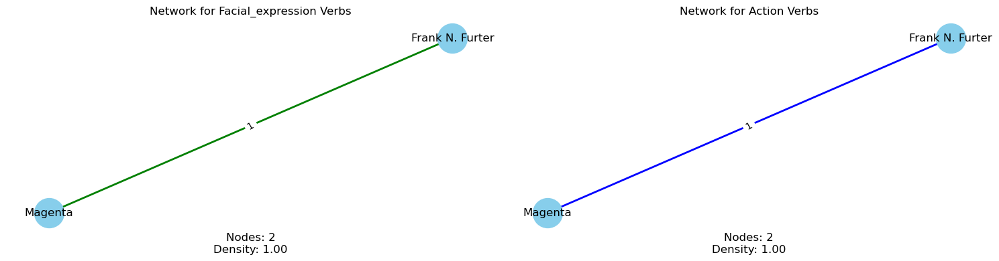

In [86]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/51831301_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [315]:
##52511266_txt.txt

[(['Frank N. Furter', 'Janet Weiss'], [('yell', 'conversations'), ('try', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('call', 'conversations'), ('recall', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('exclaim', 'conversations'), ('smile', 'facial_expression'), ('like', 'affection'), ('offer', 'action'), ('notice', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('call', 'conversations'), ('watch', 'facial_expression'), ('turn', 'action')])]


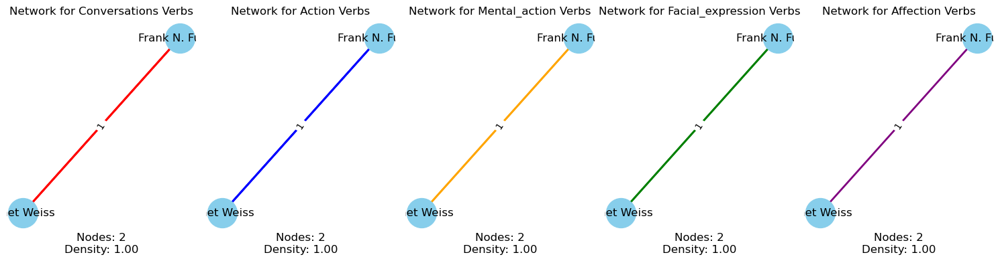

In [87]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/52511266_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [317]:
##52540231_txt.txt

[(['Magenta', 'Riff Raff'], [('saw', 'action')]), (['Columbia', 'Frank N. Furter', 'Magenta'], [('ask', 'action')]), (['Frank N. Furter', 'Magenta'], [('kiss', 'affection'), ('sing', 'action')]), (['Columbia', 'Frank N. Furter', 'Magenta'], [('explain', 'conversations'), ('kiss', 'affection'), ('pull', 'action'), ('guess', 'mental_action')]), (['Frank N. Furter', 'Magenta', 'Rocky'], [('call', 'conversations'), ('pout', 'facial_expression'), ('nod', 'action')]), (['Frank N. Furter', 'Janet Weiss', 'Rocky'], [('glance', 'facial_expression'), ('glance', 'action')]), (['Frank N. Furter', 'Janet Weiss', 'Magenta'], [('turn', 'action')]), (['Brad', 'Janet Weiss'], [('take', 'action'), ('remember', 'mental_action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss', 'Rocky'], [('try', 'action'), ('hit', 'mental_action')]), (['Brad', 'Janet Weiss'], [('deny', 'conversations'), ('hide', 'action')]), (['Brad', 'Janet Weiss'], [('love', 'affection'), ('act', 'action')]), (['Betty Munroe', 'Janet Weis

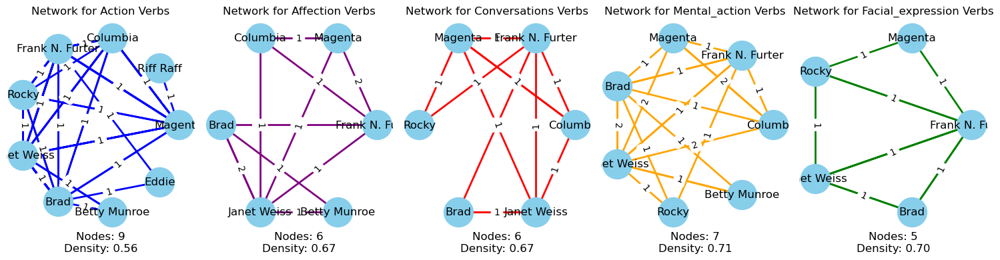

In [88]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/52540231_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [319]:
##52744153_txt.txt

[(['Brad', 'Janet Weiss'], [('cast', 'action')]), (['Brad', 'Janet Weiss'], [('take', 'action')]), (['Brad', 'Janet Weiss'], [('comment', 'conversations'), ('met', 'action')]), (['Brad', 'Janet Weiss'], [('call', 'conversations'), ('cry', 'facial_expression'), ('ask', 'action'), ('consider', 'mental_action')]), (['Brad', 'Janet Weiss'], [('tell', 'conversations'), ('thank', 'affection'), ('move', 'action'), ('feel', 'mental_action')]), (['Brad', 'Janet Weiss'], [('sigh', 'conversations'), ('kiss', 'affection'), ('ask', 'action'), ('miss', 'mental_action')]), (['Brad', 'Janet Weiss'], [('act', 'action'), ('surprise', 'mental_action')]), (['Brad', 'Betty Munroe', 'Janet Weiss', 'Ralph Hapschatt'], [('care', 'affection'), ('ask', 'action')]), (['Brad', 'Janet Weiss'], [('fall', 'action'), ('thought', 'mental_action')]), (['Brad', 'Janet Weiss'], [('explain', 'conversations'), ('laugh', 'facial_expression'), ('try', 'action'), ('thought', 'mental_action')]), (['Brad', 'Janet Weiss'], [('kn

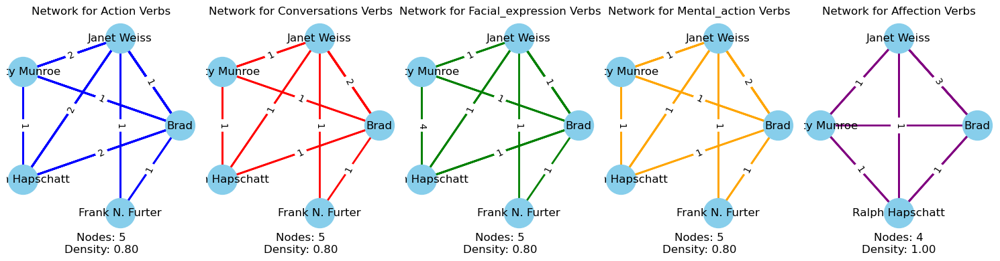

In [89]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/52744153_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [321]:
##52865872_txt.txt

[(['Brad', 'Janet Weiss'], [('sleep', 'action')]), (['Brad', 'Janet Weiss'], [('say', 'conversations'), ('scoff', 'facial_expression'), ('act', 'action'), ('thought', 'mental_action')]), (['Brad', 'Janet Weiss'], [('hurt', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('tell', 'conversations'), ('act', 'action'), ('thought', 'mental_action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('blink', 'facial_expression'), ('like', 'affection'), ('met', 'action'), ('think', 'mental_action')]), (['Brad', 'Janet Weiss'], [('ask', 'action')]), (['Frank N. Furter', 'Janet Weiss'], [('met', 'action')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('hang', 'action'), ('guess', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('eyeing', 'facial_expression')]), (['Brad', 'Frank N. Furter'], [('like', 'affection'), ('come', 'action'), ('believe', 'mental_action')]), (['Frank N. Furter', 'Janet Weiss'], [('smile', 'facial_expression'), ('huff', 'action'), ('think', 'mental_action')

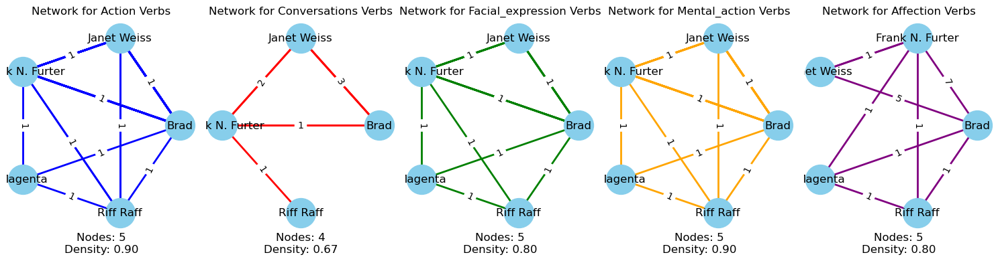

In [90]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/52865872_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [323]:
##53459851_txt.txt

[(['Frank N. Furter', 'Magenta'], [('find', 'action'), ('thought', 'mental_action')]), (['Magenta', 'Riff Raff'], [('tell', 'conversations'), ('try', 'action'), ('need', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('tell', 'conversations'), ('have', 'action')]), (['Frank N. Furter', 'Magenta'], [('try', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('walk', 'action')]), (['Frank N. Furter', 'Magenta', 'Riff Raff'], [('glance', 'facial_expression'), ('glance', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('roll', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('stare', 'facial_expression'), ('show', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('call', 'conversations'), ('stare', 'facial_expression'), ('find', 'action'), ('remember', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('comment', 'conversations'), ('work', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('lean', 'facial_expression'), ('jump', 'action')]), (['Magenta', 'Riff Raff'], [('lean', 

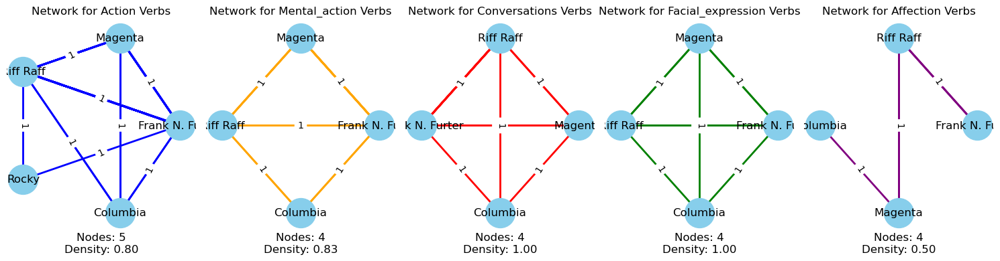

In [91]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/53459851_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [325]:
##54502897_txt.txt

[(['Columbia', 'Magenta'], [('face', 'action'), ('hit', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('sigh', 'conversations'), ('do', 'action')]), (['Columbia', 'Magenta'], [('like', 'affection')]), (['Columbia', 'Magenta'], [('met', 'action')]), (['Columbia', 'Magenta'], [('move', 'action')]), (['Columbia', 'Eddie', 'Frank N. Furter', 'Magenta'], [('call', 'conversations'), ('met', 'action')]), (['Columbia', 'Magenta'], [('love', 'affection'), ('fell', 'action'), ('feel', 'mental_action')]), (['Columbia', 'Frank N. Furter', 'Magenta'], [('break', 'action'), ('annoy', 'mental_action')]), (['Columbia', 'Riff Raff'], [('like', 'affection'), ('have', 'action')]), (['Magenta', 'Riff Raff'], [('slam', 'action')]), (['Columbia', 'Eddie', 'Magenta', 'Riff Raff'], [('care', 'affection'), ('feel', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('lean', 'facial_expression'), ('try', 'action')]), (['Columbia', 'Magenta', 'Riff Raff'], [('smile', 'facial_expression'), ('face', 'ac

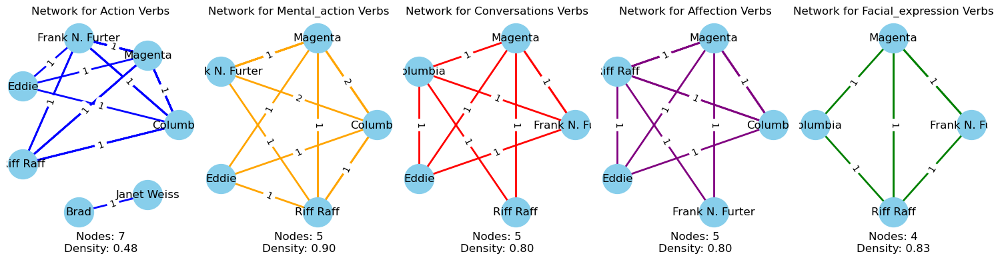

In [92]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/54502897_txt.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [327]:
##5538284.txt

[(['Columbia', 'Magenta'], [('sigh', 'conversations'), ('watch', 'facial_expression'), ('like', 'affection'), ('turn', 'action'), ('hate', 'mental_action')]), (['Columbia', 'Magenta'], [('call', 'conversations'), ('pout', 'facial_expression'), ('plan', 'action')]), (['Frank N. Furter', 'Magenta'], [('sigh', 'conversations'), ('ask', 'action'), ('wonder', 'mental_action')]), (['Columbia', 'Frank N. Furter', 'Magenta', 'Riff Raff'], [('yell', 'conversations'), ('smile', 'facial_expression'), ('stroking', 'affection'), ('turn', 'action'), ('make', 'mental_action')]), (['Columbia', 'Magenta', 'Riff Raff'], [('turn', 'action')]), (['Frank N. Furter', 'Rocky'], [('lean', 'facial_expression'), ('turn', 'action')]), (['Frank N. Furter', 'Magenta'], [('watch', 'facial_expression'), ('ask', 'action')]), (['Columbia', 'Frank N. Furter'], [('say', 'conversations'), ('take', 'action'), ('make', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('growl', 'conversations'), ('smile', 'facial_expre

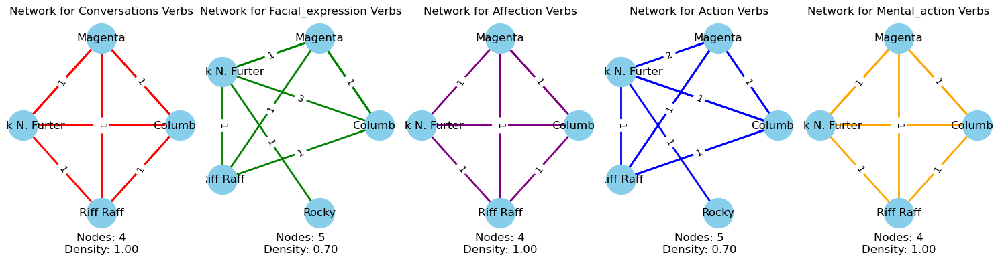

In [93]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/5538284.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [329]:
##6030289.txt

[(['Brad', 'Frank N. Furter'], [('fuck', 'action')]), (['Brad', 'Frank N. Furter'], [('do', 'action'), ('need', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('love', 'affection'), ('play', 'action'), ('hate', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('care', 'affection')]), (['Brad', 'Frank N. Furter', 'Riff Raff'], [('stand', 'action')]), (['Brad', 'Frank N. Furter', 'Riff Raff'], [('yell', 'conversations'), ('hold', 'action')]), (['Brad', 'Frank N. Furter'], [('whimper', 'facial_expression'), ('move', 'action')]), (['Brad', 'Janet Weiss'], [('love', 'affection'), ('act', 'action')]), (['Brad', 'Frank N. Furter'], [('moan', 'facial_expression'), ('help', 'action')]), (['Brad', 'Janet Weiss'], [('like', 'affection')]), (['Brad', 'Frank N. Furter', 'Janet Weiss'], [('sit', 'action')]), (['Brad', 'Frank N. Furter'], [('whisper', 'conversations'), ('push', 'action'), ('decide', 'mental_action')]), (['Brad', 'Frank N. Furter'], [('turn', 'action'), ('think', 'mental_action'

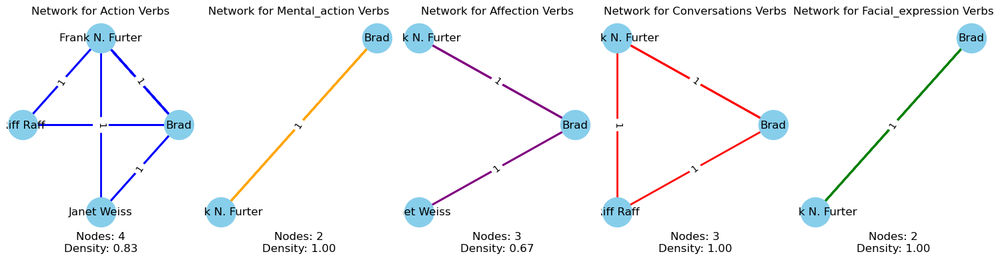

In [94]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/6030289.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [331]:
##6323518.txt

[(['Columbia', 'Magenta', 'Riff Raff'], [('lift', 'action')]), (['Columbia', 'Rocky'], [('love', 'affection'), ('play', 'action')]), (['Columbia', 'Magenta', 'Riff Raff', 'Rocky'], [('lay', 'action')])]


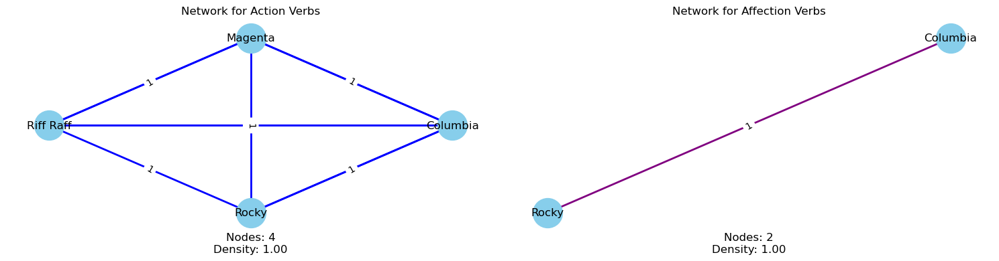

In [95]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/6323518.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [333]:
##7523557.txt

[(['Frank N. Furter', 'Riff Raff'], [('comment', 'conversations'), ('like', 'affection'), ('sit', 'action'), ('need', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('like', 'affection'), ('win', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('smile', 'facial_expression'), ('turn', 'action'), ('wish', 'mental_action')]), (['Frank N. Furter', 'Riff Raff'], [('smile', 'facial_expression'), ('ask', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('growl', 'conversations'), ('smile', 'facial_expression'), ('nod', 'action')]), (['Frank N. Furter', 'Riff Raff'], [('plan', 'action'), ('hate', 'mental_action')]), (['Magenta', 'Riff Raff'], [('lean', 'facial_expression'), ('turn', 'action')]), (['Magenta', 'Riff Raff'], [('scream', 'conversations'), ('watch', 'facial_expression'), ('turn', 'action'), ('thought', 'mental_action')]), (['Frank N. Furter', 'Magenta'], [('care', 'affection'), ('shake', 'action')]), (['Magenta', 'Riff Raff'], [('like', 'affection'), ('take', 'action'), (

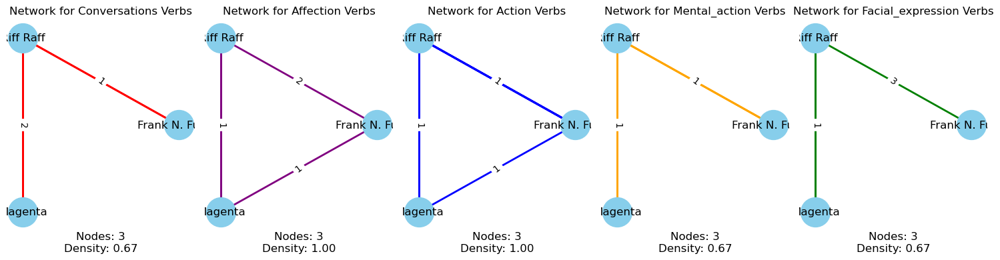

In [96]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/7523557.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [335]:
##8186731.txt

[(['Brad', 'Frank N. Furter', 'Janet Weiss'], [('call', 'conversations'), ('get', 'action'), ('think', 'mental_action')])]


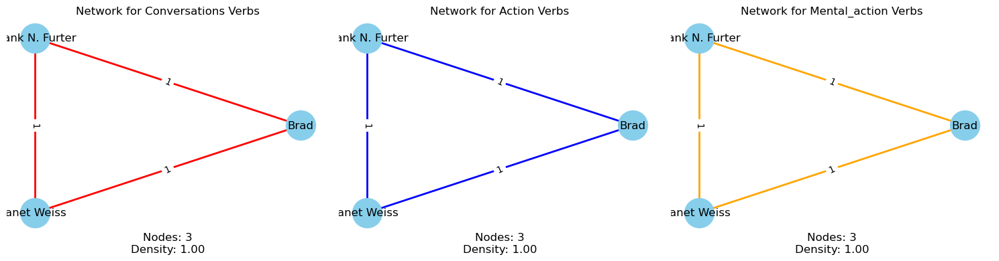

In [97]:
import json
import re
import networkx as nx
import matplotlib.pyplot as plt

# 读取动作类型的 JSON 文件
def load_action_verbs(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        action_verbs = json.load(file)
    return action_verbs

# 读取人物名称及其变体的 JSON 文件
def load_character_variants(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        character_variants = json.load(file)
    return character_variants

# 读取文本文件
def read_text_file(filepath):
    with open(filepath, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# 提取包含多个人物名称的句子
def extract_relevant_sentences(text, character_variants):
    sentences = re.split(r'(?<=[.!?]) +', text)
    relevant_sentences = []
    
    for sentence in sentences:
        characters = find_characters_in_text(sentence, character_variants)
        if len(characters) >= 2:
            relevant_sentences.append((sentence, characters))
    
    return relevant_sentences

# 提取句子中的人物名称和动词类型
def extract_characters_and_verbs(sentence, character_variants, action_verbs):
    characters = find_characters_in_text(sentence, character_variants)
    verbs = find_verbs_in_text(sentence, action_verbs)
    return characters, verbs

# 在句子中查找人物名称
def find_characters_in_text(text, character_variants):
    characters_in_text = []
    for character, variants in character_variants.items():
        for variant in variants:
            if variant in text:
                characters_in_text.append(character)
                break
    return characters_in_text

# 在句子中查找动词并确定其类型
def find_verbs_in_text(text, action_verbs):
    verbs_in_text = []
    for verb_type, verbs in action_verbs.items():
        for verb in verbs:
            if verb in text:
                verbs_in_text.append((verb, verb_type))
                break
    return verbs_in_text

# 示例文本文件路径
text_file_path = '/Users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/8186731.txt'

# 读取文本文件
text = read_text_file(text_file_path)

# 读取动作类型的 JSON 文件路径
action_verbs_file = 'verb_cater_1.json'

# 读取人物名称及其变体的 JSON 文件路径
character_variants_file = 'character_variants_RHPS.json'

# 读取动作类型的 JSON 文件
action_verbs = load_action_verbs(action_verbs_file)

# 读取人物名称及其变体的 JSON 文件
character_variants = load_character_variants(character_variants_file)

# 提取包含多个人物名称的句子
relevant_sentences = extract_relevant_sentences(text, character_variants)

# 分析句子并提取人物名称和动词类型
character_verb_pairs = []
for sentence, _ in relevant_sentences:
    characters, verbs = extract_characters_and_verbs(sentence, character_variants, action_verbs)
    if characters and verbs:
        character_verb_pairs.append((characters, verbs))

print(character_verb_pairs)

# 根据动词类型构建多重边人物网络
def build_multiedge_network(character_verb_pairs):
    networks = {}
    for characters, verbs in character_verb_pairs:
        for verb, verb_type in verbs:
            if verb_type not in networks:
                networks[verb_type] = nx.MultiGraph()
            network = networks[verb_type]
            for i, char1 in enumerate(characters):
                for char2 in characters[i + 1:]:
                    if network.has_edge(char1, char2, key=verb):
                        network[char1][char2][verb]['weight'] += 1
                    else:
                        network.add_edge(char1, char2, key=verb, weight=1, type=verb_type)
    return networks

# 计算网络密度
def calculate_network_density(network):
    simple_network = nx.Graph(network)  # 将多重图转换为简单图
    density = nx.density(simple_network)
    return density

# 可视化多重边人物网络
def visualize_multiedge_networks(networks):
    colors = {
        'conversations': 'red',
        'action': 'blue',
        'mental_action': 'orange',
        'affection': 'purple',
        'facial_expression': 'green'
    }
    fig, axes = plt.subplots(nrows=1, ncols=len(networks), figsize=(15, 4))  # 创建多个子图

    for i, (verb_type, network) in enumerate(networks.items()):
        if network.number_of_edges() > 0:
            pos = nx.circular_layout(network)
            nx.draw(network, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color=colors[verb_type], width=2, ax=axes[i])
            
            # 绘制边的权重
            edge_labels = {(u, v): d['weight'] for u, v, d in network.edges(data=True)}
            nx.draw_networkx_edge_labels(network, pos, edge_labels=edge_labels, font_color='black', ax=axes[i])

            # 计算并显示节点数量和网络密度
            node_count = network.number_of_nodes()
            network_density = calculate_network_density(network)
            axes[i].text(0.5, -0.1, f'Nodes: {node_count}\nDensity: {network_density:.2f}', size=12, ha='center', transform=axes[i].transAxes)
            
            axes[i].set_title(f'Network for {verb_type.capitalize()} Verbs')

    plt.tight_layout()  # 调整布局，防止重叠
    plt.show()

# 构建多重边人物网络
networks = build_multiedge_network(character_verb_pairs)

# 可视化多重边人物网络
visualize_multiedge_networks(networks)


In [337]:
##9351971.txt（返回原文检查）